In [1]:
!uv pip install -q scikit-learn==1.6.1 imblearn --system

In [2]:
import wave,os,librosa,tqdm,time,warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import librosa, os, cv2, pickle, tqdm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from cuml.svm import SVC as cuSVC
from cuml.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from imblearn.over_sampling import SMOTE
import IPython.display as ipd

2025-07-06 15:00:02.152424: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751814002.531730      77 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751814002.638825      77 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
df = pd.read_csv('/kaggle/input/iemocap-mfcc-etc-features-4-emo-nr/iemocapmfccfeatures_noisereduced_4labels.csv')
df = df.iloc[:,1:]
df

,mfcc1,mfcc2,mfcc3,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,...,spectral_contrast5,spectral_contrast6,spectral_contrast7,tonnetz1,tonnetz2,tonnetz3,tonnetz4,tonnetz5,tonnetz6,label
0,-531.46954,70.996380,24.289910,37.130524,11.040465,13.429672,-10.408956,9.234770,3.033351,4.706578,...,41.759185,32.799925,32.824491,-0.013406,0.027340,-0.063669,-0.060761,-0.007241,-0.002479,hap
1,-296.56567,63.583500,-29.345580,-4.472399,-12.874627,-6.588419,-17.790037,-0.734459,-7.140967,-3.291160,...,32.311330,33.811254,27.959841,0.004459,-0.026533,-0.037201,-0.005310,-0.002735,0.015463,hap
2,-425.39337,64.611725,-5.628653,4.907248,-6.341900,-5.900495,-22.331976,-18.388199,-17.528366,-5.826988,...,33.914708,38.781664,32.665988,-0.017530,0.009397,0.032661,-0.073044,-0.022444,-0.027235,hap
3,-485.98553,81.998640,-14.296952,12.400829,-9.557034,-16.055355,-19.032717,-10.934519,-6.073104,1.379356,...,35.471898,40.588257,39.586396,-0.040091,-0.010479,-0.018630,-0.069136,-0.007288,-0.032080,hap
4,-372.22470,72.500206,-33.745865,-3.283597,-21.188143,-14.334318,-26.033096,-14.806952,-12.331807,-8.430577,...,30.044462,44.137722,45.740002,0.046572,-0.021082,0.067702,-0.000495,-0.011582,-0.014994,hap
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5526,-660.49097,30.096292,5.989079,19.971521,-6.340953,1.281596,-6.128734,0.691295,-2.699449,3.595718,...,21.346046,24.400202,33.304831,-0.009080,0.013348,-0.007568,-0.045513,-0.014076,-0.013464,sad
5527,-604.97797,121.800390,-14.806895,37.024250,-20.087963,29.533115,-13.827265,14.362831,6.730568,-0.473424,...,27.116371,30.568890,16.958251,0.047847,0.033999,-0.130765,0.074053,-0.017805,-0.023573,hap
5528,-574.21070,41.987686,-1.729624,19.536690,-0.596501,0.114694,-9.045651,-6.101354,-6.407044,-1.356042,...,29.285427,33.121149,36.115920,-0.004333,0.005258,0.027371,-0.001035,-0.004833,0.003488,hap
5529,-454.46940,75.403970,-10.331232,32.191322,-20.591536,5.771362,-8.142285,-9.612243,-12.282533,1.858377,...,30.246386,46.538844,38.759385,-0.013344,0.034243,-0.031079,-0.021639,-0.016630,-0.015865,hap


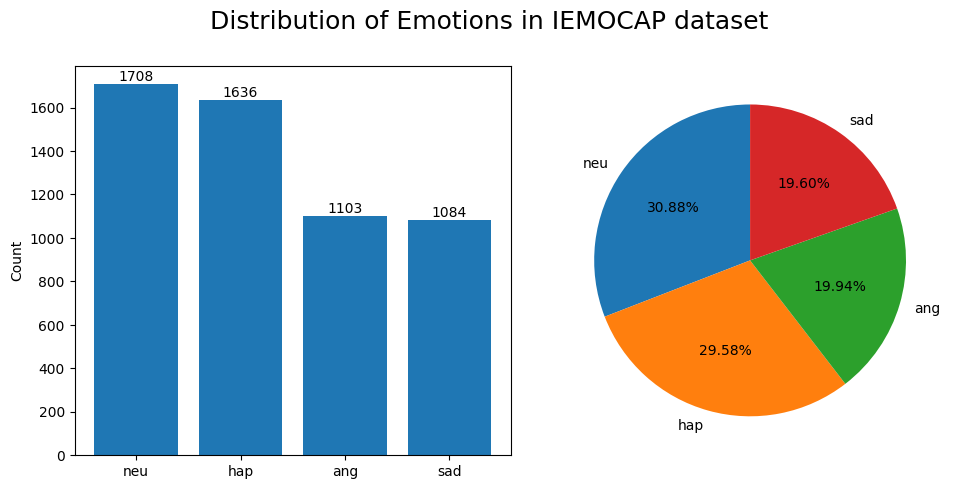

In [4]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
bars = plt.bar(df['label'].value_counts().index, df['label'].value_counts().values)
plt.ylabel("Count")
for bar in bars.patches:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(),bar.get_height(), ha='center', va='bottom')
plt.subplot(1, 2, 2)
df['label'].value_counts().plot(kind='pie',autopct='%1.2f%%',startangle=90)
plt.ylabel('')
plt.suptitle('Distribution of Emotions in IEMOCAP dataset', fontsize=18)
plt.tight_layout(pad=1.5)
plt.show()

### **Preprocessing, Training, Hyperparameter Tuning and Testing using ML Models**

In [5]:
def preprocess_split_train_test(df,model,name,apply_smote=False,rs=536,printres=True,returnModelFiles=False,apply_LDA=True,hppms=None):
  x = df.drop(['label'], axis=1)
  y = df['label']
  trainX, testX, trainY, testY = train_test_split(x, y, test_size=0.2, random_state=rs,stratify=y)
  scaler = StandardScaler()
  trainX = scaler.fit_transform(trainX)
  testX = scaler.transform(testX)
  if apply_LDA:
    lda = LinearDiscriminantAnalysis()
    trainX = lda.fit_transform(trainX, trainY)
    testX = lda.transform(testX)
  le = LabelEncoder()
  y2 = le.fit_transform(y)
  if name in ['XGBoost','SVM','KNN']:
    trainY, testY = le.transform(trainY), le.transform(testY)
  if apply_smote:
    smote = SMOTE(random_state=42)
    trainX, trainY = smote.fit_resample(trainX, trainY)
  if name in ['XGBoost','SVM']:
      if isinstance(trainY, pd.Series):
          trainY = trainY.to_numpy().astype(np.int32)
          testY = testY.to_numpy().astype(np.int32)
      else:
          trainY = trainY.astype(np.int32)
          testY = testY.astype(np.int32)
  #print(trainX.shape,trainX.var())
  model.fit(trainX, trainY)
  predictions = model.predict(testX)
  acc = accuracy_score(testY, predictions)
  #print(model.get_params())
  #print(acc)
  if printres:
    plot_confusion_matrix(testY, predictions,le.classes_)
    print(f"\n{name} Accuracy: {acc*100:.3f}%")
    print(classification_report(testY, predictions))
  if returnModelFiles:
    return model,scaler,acc
  if hppms:
    return acc,hppms
  return acc

In [6]:
def plot_confusion_matrix(y_true, y_pred,labels):
  cm = confusion_matrix(y_true, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=labels)
  disp.plot(cmap=plt.cm.Blues)
  plt.title("Confusion Matrix")
  plt.show()

#### **Hyperparameter Tuning of ML and Ensemble Models**

In [7]:
def getRandparams(mname):
    if mname == 'SVM':
        model_params = {
            'C': 10**np.random.uniform(np.log10(0.01), np.log10(10)),
            'gamma': 10**np.random.uniform(np.log10(0.00005), np.log10(0.0003)),
            'coef0': 10**np.random.uniform(0, np.log10(0.1)),
            'class_weight': np.random.choice(['balanced', None]),
            'multiclass_strategy': np.random.choice(['ovo', 'ovr']),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'XGBoost':
        model_params = {
            'learning_rate': np.random.uniform(0.01, 0.5),
            'n_estimators': np.random.randint(50, 200),
            'max_depth': np.random.randint(3, 20),
            'min_child_weight': np.random.randint(1, 10),
            'gamma': np.random.uniform(0, 1),
            'subsample': np.random.uniform(0.3, 1),
            'colsample_bytree': np.random.uniform(0.5, 1),
            'reg_alpha': np.random.uniform(0, 1),
            'reg_lambda': np.random.uniform(0, 1),
            'scale_pos_weight': np.random.uniform(1, 15),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'LogisticRegression':
        model_params = {
            'C': 10**np.random.uniform(np.log10(0.001), np.log10(10)),
            'solver': np.random.choice(['newton-cg', 'lbfgs','liblinear' ,'sag', 'saga']),
            'class_weight': np.random.choice(['balanced', None]),
            'penalty': np.random.choice(['l1', 'l2', 'elasticnet', None]),
            'random_state': np.random.randint(0, 1000),
        }
        if model_params['solver'] in ['lbfgs','newton-cg','sag']:
            model_params['penalty'] = np.random.choice(['l2', None])
        if model_params['solver'] == 'liblinear':
            model_params['penalty'] = np.random.choice(['l1', 'l2'])
        if model_params.get('penalty') == 'elasticnet':
            model_params['l1_ratio'] = np.random.uniform(0.0, 1.0)
    elif mname == 'RandomForest':
        model_params = {
            'n_estimators': np.random.randint(50, 600),
            'max_depth': np.random.randint(3, 50),
            'min_samples_split': np.random.randint(2, 20),
            'min_samples_leaf': np.random.randint(1, 10),
            'max_features': np.random.choice(['sqrt', 'log2', None]),
            'bootstrap': np.random.choice([True, False]),
            'class_weight': np.random.choice(['balanced', 'balanced_subsample', None]),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'KNN':
        model_params = {
            'n_neighbors': np.random.randint(3, 40),
            'weights': np.random.choice(['uniform', 'distance']),
            'algorithm': np.random.choice(['auto', 'ball_tree', 'kd_tree', 'brute']),
            'leaf_size': np.random.randint(20, 50),
            'p': np.random.choice([1, 2]),  # Minkowski metric (p=1 for Manhattan, p=2 for Euclidean)
        }
    elif mname == 'DecisionTree':
        model_params = {
            'criterion': np.random.choice(['gini', 'entropy', 'log_loss']),
            'splitter': np.random.choice(['best', 'random']),
            'max_depth': np.random.randint(3, 50),
            'min_samples_split': np.random.randint(2, 20),
            'min_samples_leaf': np.random.randint(1, 10),
            'max_features': np.random.choice([None, 'sqrt', 'log2']),
            'random_state': np.random.randint(0, 1000),
        }
    elif mname == 'NaiveBayes':
        model_params = {
            'var_smoothing': 1e-9
        }
    elif mname == 'AdaBoost':
        model_params = {
            'n_estimators': np.random.randint(50, 100),
            'learning_rate': np.random.uniform(0,2),
            'random_state': np.random.randint(0, 1000)
        }
    else:
        raise ValueError(f"Unsupported model name: {mname}")
    
    return model_params

In [8]:
def tune_ML_hppms(mname,model,iters=20,rs=None,apply_smote=None,apply_LDA=None):
    hpr = []
    max_acc = 0
    best_model_params,best_prep_params,phist = dict(),dict(),dict()
    st0 = time.time()
    all_params = dict()
    for k in range(iters):
        st = time.time()
        model_params = getRandparams(mname)
        rs2 = rs if rs else np.random.randint(0, 1000)
        smote = apply_smote if apply_smote is not None else np.random.choice([True,False])
        lda = apply_LDA if apply_LDA is not None else np.random.choice([True,False])
        prep_params = {'rs': rs2,
                       'apply_smote': smote,
                        'apply_LDA': lda}
        all_params = {**model_params, **prep_params}
        fparams = frozenset(all_params.items())
        #update model params
        model.set_params(**model_params)
        print(f"Iter No. - {k}")
        print(f"Model Params = {model_params}")
        print(f"Preprocessing Params = {prep_params}")
        acc = preprocess_split_train_test(df,model,mname,**prep_params,printres=False)
        en = time.time()
        tm = en-st
        tm0 = en-st0
        print(f"Time taken = {int(tm/60)} min {int(tm%60)} sec")
        ipd.clear_output(wait=True)
        print(f"Total Time taken = {int(tm0/60)} min {int(tm0%60)} sec")
        phist[fparams] = acc
        if acc>max_acc:
            max_acc = acc
            best_model_params = model_params
            best_prep_params = prep_params
            best_iter = k
        print(f"\nCurrent Accuracy = {acc*100:.2f}%")
        print(f"Best Accuracy = {max_acc*100:.2f}% at iter={best_iter}")
        print(f"Best Model Params Found so far = {best_model_params}\n")
        print(f"Best Preprocessing Params Found so far = {best_prep_params}\n")
    print("Hyperparameter Tuning Done!")
    model.set_params(**best_model_params)
    acc = preprocess_split_train_test(df,model,mname,**best_prep_params)
    return max_acc,best_model_params,best_prep_params,phist

In [9]:
def getRandParamsOptuna(mname,trial,n_features,sp_params=None):
    sp_params = sp_params or {}  # default to empty dict
    if mname == 'SVM':
        if 'C' in sp_params and isinstance(sp_params['C'], tuple):
            C = 10 ** trial.suggest_uniform('C', sp_params['C'][0], sp_params['C'][1])
        elif 'C' in sp_params:
            C = sp_params['C']
        else:
            C = trial.suggest_uniform('C',0.01,10)
        kernel = sp_params.get('kernel') or trial.suggest_categorical(
            'kernel', ['linear', 'poly', 'rbf', 'sigmoid']
        )
        multiclass_strategy = sp_params.get('multiclass_strategy') or trial.suggest_categorical(
            'multiclass_strategy', ['ovo', 'ovr']
        )
        gamma, coef0, random_state = None, None, None
        if sp_params.get('kernel') != 'linear':
            if 'gamma' in sp_params and isinstance(sp_params['gamma'], tuple):
                gamma = trial.suggest_uniform('gamma', sp_params['gamma'][0], sp_params['gamma'][1])
            elif 'gamma' in sp_params:
                gamma = sp_params['gamma']
            else:
                gamma_mode = trial.suggest_categorical('gamma', ['auto', 'scale', 'float'])
                if gamma_mode == 'float':
                    scale = 1 / n_features
                    gamma = trial.suggest_uniform('gamma_value', scale/10, scale*10)
                else:
                    gamma = gamma_mode
    
            if 'coef0' in sp_params and isinstance(sp_params['coef0'], tuple):
                coef0 = trial.suggest_uniform('coef0', sp_params['coef0'][0], sp_params['coef0'][1])
            elif 'coef0' in sp_params:
                coef0 = sp_params['coef0']
            else:
                coef0 = trial.suggest_uniform('coef0', 0, 1)
    
            if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
                random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
            elif 'random_state' in sp_params:
                random_state = sp_params['random_state']
            else:
                random_state = trial.suggest_int('random_state', 0, 1000)
            
        class_weight = sp_params.get('class_weight') or trial.suggest_categorical(
            'class_weight', ['balanced', None]
        )

        model_params = {
            'C': C,
            'kernel': kernel,
            'gamma': gamma or None,
            'coef0': coef0 or None,
            'class_weight': class_weight,
            'multiclass_strategy': multiclass_strategy,
            'random_state': random_state or None
        }
    elif mname == 'XGBoost':
        if 'learning_rate' in sp_params and isinstance(sp_params['learning_rate'], tuple):
            learning_rate = trial.suggest_uniform('learning_rate', sp_params['learning_rate'][0], sp_params['learning_rate'][1])
        elif 'learning_rate' in sp_params:
            learning_rate = sp_params['learning_rate']
        else:
            learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.5)
    
        if 'n_estimators' in sp_params and isinstance(sp_params['n_estimators'], tuple):
            n_estimators = trial.suggest_int('n_estimators', sp_params['n_estimators'][0], sp_params['n_estimators'][1])
        elif 'n_estimators' in sp_params:
            n_estimators = sp_params['n_estimators']
        else:
            n_estimators = trial.suggest_int('n_estimators', 50, 200)
    
        if 'max_depth' in sp_params and isinstance(sp_params['max_depth'], tuple):
            max_depth = trial.suggest_int('max_depth', sp_params['max_depth'][0], sp_params['max_depth'][1])
        elif 'max_depth' in sp_params:
            max_depth = sp_params['max_depth']
        else:
            max_depth = trial.suggest_int('max_depth', 3, 20)
    
        if 'min_child_weight' in sp_params and isinstance(sp_params['min_child_weight'], tuple):
            min_child_weight = trial.suggest_int('min_child_weight', sp_params['min_child_weight'][0], sp_params['min_child_weight'][1])
        elif 'min_child_weight' in sp_params:
            min_child_weight = sp_params['min_child_weight']
        else:
            min_child_weight = trial.suggest_int('min_child_weight', 1, 10)
    
        if 'gamma' in sp_params and isinstance(sp_params['gamma'], tuple):
            gamma = trial.suggest_uniform('gamma', sp_params['gamma'][0], sp_params['gamma'][1])
        elif 'gamma' in sp_params:
            gamma = sp_params['gamma']
        else:
            gamma = trial.suggest_uniform('gamma', 0, 1)
    
        if 'subsample' in sp_params and isinstance(sp_params['subsample'], tuple):
            subsample = trial.suggest_uniform('subsample', sp_params['subsample'][0], sp_params['subsample'][1])
        elif 'subsample' in sp_params:
            subsample = sp_params['subsample']
        else:
            subsample = trial.suggest_uniform('subsample', 0.3, 1)
    
        if 'colsample_bytree' in sp_params and isinstance(sp_params['colsample_bytree'], tuple):
            colsample_bytree = trial.suggest_uniform('colsample_bytree', sp_params['colsample_bytree'][0], sp_params['colsample_bytree'][1])
        elif 'colsample_bytree' in sp_params:
            colsample_bytree = sp_params['colsample_bytree']
        else:
            colsample_bytree = trial.suggest_uniform('colsample_bytree', 0.5, 1)
    
        if 'reg_alpha' in sp_params and isinstance(sp_params['reg_alpha'], tuple):
            reg_alpha = trial.suggest_uniform('reg_alpha', sp_params['reg_alpha'][0], sp_params['reg_alpha'][1])
        elif 'reg_alpha' in sp_params:
            reg_alpha = sp_params['reg_alpha']
        else:
            reg_alpha = trial.suggest_uniform('reg_alpha', 0, 1)
    
        if 'reg_lambda' in sp_params and isinstance(sp_params['reg_lambda'], tuple):
            reg_lambda = trial.suggest_uniform('reg_lambda', sp_params['reg_lambda'][0], sp_params['reg_lambda'][1])
        elif 'reg_lambda' in sp_params:
            reg_lambda = sp_params['reg_lambda']
        else:
            reg_lambda = trial.suggest_uniform('reg_lambda', 0, 1)
    
        if 'scale_pos_weight' in sp_params and isinstance(sp_params['scale_pos_weight'], tuple):
            scale_pos_weight = trial.suggest_uniform('scale_pos_weight', sp_params['scale_pos_weight'][0], sp_params['scale_pos_weight'][1])
        elif 'scale_pos_weight' in sp_params:
            scale_pos_weight = sp_params['scale_pos_weight']
        else:
            scale_pos_weight = trial.suggest_uniform('scale_pos_weight', 1, 15)
    
        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)
    
        model_params = {
            'learning_rate': learning_rate,
            'n_estimators': n_estimators,
            'max_depth': max_depth,
            'min_child_weight': min_child_weight,
            'gamma': gamma,
            'subsample': subsample,
            'colsample_bytree': colsample_bytree,
            'reg_alpha': reg_alpha,
            'reg_lambda': reg_lambda,
            'scale_pos_weight': scale_pos_weight,
            'random_state': random_state
        }
    elif mname == 'LogisticRegression':
        if 'C' in sp_params and isinstance(sp_params['C'], tuple):
            C = trial.suggest_uniform('C', sp_params['C'][0], sp_params['C'][1])
        elif 'C' in sp_params:
            C = sp_params['C']
        else:
            C = trial.suggest_uniform('C', 0.001, 10)

        solver = sp_params.get('solver') or trial.suggest_categorical(
            'solver', ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
        )

        if 'class_weight' in sp_params:
            class_weight = sp_params['class_weight']
        else:
            class_weight = trial.suggest_categorical('class_weight', ['balanced', None])

        if 'penalty' in sp_params:
            penalty = sp_params['penalty']
        
        else:
            if solver in ['lbfgs', 'newton-cg', 'sag']:
                penalty = trial.suggest_categorical('penalty_l2_only', ['l2', None])
            elif solver == 'liblinear':
                penalty = trial.suggest_categorical('penalty_liblinear', ['l1', 'l2'])
            else:  # e.g. saga
                penalty = trial.suggest_categorical('penalty_all', ['l1', 'l2', 'elasticnet', None])

        if penalty == 'elasticnet':
            if 'l1_ratio' in sp_params:
                l1_ratio = sp_params['l1_ratio']
            else:
                l1_ratio = trial.suggest_uniform('l1_ratio', 0.0, 1.0)
        else:
            l1_ratio = None

        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)

        model_params = {
            'C': C,
            'solver': solver,
            'class_weight': class_weight,
            'penalty': penalty,
            'random_state': random_state
        }
        if l1_ratio is not None:
            model_params['l1_ratio'] = l1_ratio
    elif mname == 'RandomForest':
        if 'n_estimators' in sp_params and isinstance(sp_params['n_estimators'], tuple):
            n_estimators = trial.suggest_int('n_estimators', sp_params['n_estimators'][0], sp_params['n_estimators'][1])
        elif 'n_estimators' in sp_params:
            n_estimators = sp_params['n_estimators']
        else:
            n_estimators = trial.suggest_int('n_estimators', 50, 600)
    
        if 'max_depth' in sp_params and isinstance(sp_params['max_depth'], tuple):
            max_depth = trial.suggest_int('max_depth', sp_params['max_depth'][0], sp_params['max_depth'][1])
        elif 'max_depth' in sp_params:
            max_depth = sp_params['max_depth']
        else:
            max_depth = trial.suggest_int('max_depth', 3, 50)
    
        if 'min_samples_split' in sp_params and isinstance(sp_params['min_samples_split'], tuple):
            min_samples_split = trial.suggest_int('min_samples_split', sp_params['min_samples_split'][0], sp_params['min_samples_split'][1])
        elif 'min_samples_split' in sp_params:
            min_samples_split = sp_params['min_samples_split']
        else:
            min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    
        if 'min_samples_leaf' in sp_params and isinstance(sp_params['min_samples_leaf'], tuple):
            min_samples_leaf = trial.suggest_int('min_samples_leaf', sp_params['min_samples_leaf'][0], sp_params['min_samples_leaf'][1])
        elif 'min_samples_leaf' in sp_params:
            min_samples_leaf = sp_params['min_samples_leaf']
        else:
            min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    
        if 'max_features' in sp_params:
            max_features = sp_params['max_features']
        else:
            max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    
        if 'bootstrap' in sp_params:
            bootstrap = sp_params['bootstrap']
        else:
            bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    
        if 'class_weight' in sp_params:
            class_weight = sp_params['class_weight']
        else:
            class_weight = trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample', None])
    
        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)
    
        model_params = {
            'n_estimators': n_estimators,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'max_features': max_features,
            'bootstrap': bootstrap,
            'class_weight': class_weight,
            'random_state': random_state
        }
    elif mname == 'KNN':
        if 'n_neighbors' in sp_params and isinstance(sp_params['n_neighbors'], tuple):
            n_neighbors = trial.suggest_int('n_neighbors', sp_params['n_neighbors'][0], sp_params['n_neighbors'][1])
        elif 'n_neighbors' in sp_params:
            n_neighbors = sp_params['n_neighbors']
        else:
            n_neighbors = trial.suggest_int('n_neighbors', 3, 40)

        weights = sp_params.get('weights') or trial.suggest_categorical('weights', ['uniform', 'distance'])

        algorithm = sp_params.get('algorithm') or trial.suggest_categorical('algorithm',['auto', 'ball_tree', 'kd_tree', 'brute'])

        if 'leaf_size' in sp_params and isinstance(sp_params['leaf_size'], tuple):
            leaf_size = trial.suggest_int('leaf_size', sp_params['leaf_size'][0], sp_params['leaf_size'][1])
        elif 'leaf_size' in sp_params:
            leaf_size = sp_params['leaf_size']
        else:
            leaf_size = trial.suggest_int('leaf_size', 20, 50)

        p = sp_params.get('p') or trial.suggest_categorical('p',[1,2])
            
        model_params = {
            'n_neighbors': n_neighbors,
            'weights': weights,
            'algorithm': algorithm,
            'leaf_size': leaf_size,
            'p': p,
        }
    elif mname == 'DecisionTree':
        criterion = sp_params.get('criterion') or trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])
        splitter = sp_params.get('splitter') or trial.suggest_categorical('splitter', ['best', 'random'])

        if 'max_depth' in sp_params and isinstance(sp_params['max_depth'], tuple):
            max_depth = trial.suggest_int('max_depth', sp_params['max_depth'][0], sp_params['max_depth'][1])
        elif 'max_depth' in sp_params:
            max_depth = sp_params['max_depth']
        else:
            max_depth = trial.suggest_int('max_depth', 3, 50)

        if 'min_samples_split' in sp_params and isinstance(sp_params['min_samples_split'], tuple):
            min_samples_split = trial.suggest_int('min_samples_split', sp_params['min_samples_split'][0], sp_params['min_samples_split'][1])
        elif 'min_samples_split' in sp_params:
            min_samples_split = sp_params['min_samples_split']
        else:
            min_samples_split = trial.suggest_int('min_samples_split', 2, 20)

        if 'min_samples_leaf' in sp_params and isinstance(sp_params['min_samples_leaf'], tuple):
            min_samples_leaf = trial.suggest_int('min_samples_leaf', sp_params['min_samples_leaf'][0], sp_params['min_samples_leaf'][1])
        elif 'min_samples_leaf' in sp_params:
            min_samples_leaf = sp_params['min_samples_leaf']
        else:
            min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)

        if 'max_features' in sp_params:
            max_features = sp_params['max_features']
        else:
            max_features = trial.suggest_categorical('max_features', [None, 'sqrt', 'log2'])

        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)

        model_params = {
            'criterion': criterion,
            'splitter': splitter,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'max_features': max_features,
            'random_state': random_state
        }
    elif mname == 'NaiveBayes':
        model_params = {
            'var_smoothing': 1e-9
        }
    elif mname == 'AdaBoost':
        if 'n_estimators' in sp_params and isinstance(sp_params['n_estimators'], tuple):
            n_estimators = trial.suggest_int('n_estimators', sp_params['n_estimators'][0], sp_params['n_estimators'][1])
        elif 'n_estimators' in sp_params:
            n_estimators = sp_params['n_estimators']
        else:
            n_estimators = trial.suggest_int('n_estimators', 50, 100)

        if 'learning_rate' in sp_params and isinstance(sp_params['learning_rate'], tuple):
            learning_rate = trial.suggest_uniform('learning_rate', sp_params['learning_rate'][0], sp_params['learning_rate'][1])
        elif 'learning_rate' in sp_params:
            learning_rate = sp_params['learning_rate']
        else:
            learning_rate = trial.suggest_uniform('learning_rate', 0, 2)

        if 'random_state' in sp_params and isinstance(sp_params['random_state'], tuple):
            random_state = trial.suggest_int('random_state', sp_params['random_state'][0], sp_params['random_state'][1])
        elif 'random_state' in sp_params:
            random_state = sp_params['random_state']
        else:
            random_state = trial.suggest_int('random_state', 0, 1000)
            
        model_params = {
            'n_estimators': n_estimators,
            'learning_rate': learning_rate,
            'random_state': random_state
        }
    else:
        raise ValueError(f"Unsupported model name: {mname}")
    
    return model_params

In [10]:
import optuna
from optuna.visualization import plot_optimization_history, plot_param_importances

optuna.logging.set_verbosity(optuna.logging.WARNING)

def live_progress_callback(study, trial):
    ipd.clear_output(wait=True)
    print(f"Trial: {trial.number}\n"
          f"Params: {trial.params}\n"
          f"Accuracy = {trial.value*100:.2f}%\n")
    print(f"Best so far :\n "
          f"Trial: {study.best_trial.number}\n"
          f"Params: {study.best_params}\n"
          f"Accuracy = {study.best_value*100:.2f}%")

def run_optuna(mname,model,n_trials=20,rs=None,apply_smote=None,apply_LDA=None,sp_params=None):
    def optuna_objective(trial):
        rs2 = rs if rs else trial.suggest_int('rs',0, 1000)
        smote = apply_smote if apply_smote is not None else trial.suggest_categorical('apply_smote',[True,False])
        lda = apply_LDA if apply_LDA is not None else trial.suggest_categorical('apply_LDA',[True,False])
        prep_params = {'rs': rs2,
                       'apply_smote': smote,
                        'apply_LDA': lda}
        n_features = len(df['label'].unique())-1 if lda else df.shape[1]-1
        params = getRandParamsOptuna(mname,trial,n_features,sp_params)
        local_model = model
        if mname == 'SVM' and params['gamma'] == 'float':
            params['gamma'] = params['gamma_value']
        if mname == 'SVM' and params['kernel'] == 'linear':
            params_to_remove = ['kernel', 'random_state', 'coef0', 'gamma']
            filtered_params = {k: v for k, v in params.items() if k not in params_to_remove}
            local_model = LinearSVC(**filtered_params)
        else:
            local_model.set_params(**params)
        return preprocess_split_train_test(df,local_model,mname,printres=False,**prep_params)

    #sampler = optuna.samplers.TPESampler(multivariate=True,constant_liar=True)
    #pruner = optuna.pruners.HyperbandPruner()
    #study = optuna.create_study(sampler=sampler, pruner=pruner, direction='maximize')
    study = optuna.create_study(direction='maximize')
    start = time.time()
    study.optimize(optuna_objective, n_trials=n_trials,callbacks=[live_progress_callback])
    end = time.time()
    prep_prms = ['rs','apply_smote','apply_LDA']
    best_params = study.best_params
    if rs:
        best_params['rs'] = rs
    if apply_smote is not None:
        best_params['apply_smote'] = apply_smote
    if apply_LDA is not None:
        best_params['apply_LDA'] = apply_LDA
    if sp_params:
        for p,v in sp_params.items():
            if not isinstance(v,tuple):
                best_params[p] = v
    best_prep_params = {k:v for k,v in best_params.items() if k in prep_prms}
    best_model_params = {k:v for k,v in best_params.items() if k not in prep_prms}
    local_model = model
    if mname == 'SVM' and best_model_params['kernel'] == 'linear':
        params_to_remove = ['kernel', 'random_state', 'coef0', 'gamma']
        filtered_params = {k: v for k, v in best_model_params.items() if k not in params_to_remove}
        local_model = LinearSVC(**filtered_params)
    else:
        for pen in ['penalty_l2_only', 'penalty_liblinear', 'penalty_all']:
            if pen in best_model_params:
                best_model_params['penalty'] = best_model_params.pop(pen)
                break
        local_model.set_params(**best_model_params)
    #print(local_model.get_params())
    #print(best_prep_params)
    #print(best_model_params)
    acc = preprocess_split_train_test(df,local_model,mname,**best_prep_params)
    #print(acc)
    print(f"\nTime taken = {int((end-start)/60)} min {int((end-start)%60)} sec\n")
    return {
        'best_score': study.best_value,
        'best_params': best_params,
        'time': end - start,
        'study': study
    }

def visualize_tuning(study):
    fig1 = optuna.visualization.matplotlib.plot_optimization_history(study)
    fig2 = optuna.visualization.matplotlib.plot_param_importances(study)
    fig3 = optuna.visualization.matplotlib.plot_parallel_coordinate(study, params=list(study.best_params.keys()))
    fig3.figure.set_size_inches(15, 6)
    for collection in fig3.collections:
        if hasattr(collection, 'set_cmap'):
            collection.set_cmap(cm.coolwarm)
    plt.show(fig1)
    plt.show(fig2)
    plt.show(fig3)
    fig4 = optuna.visualization.matplotlib.plot_slice(res['study'], params=list(res['study'].best_params.keys()))
    plt.show()

### **K-Nearest Neighbors Classifier**

Total Time taken = 1 min 58 sec

Current Accuracy = 51.94%
Best Accuracy = 58.90% at iter=447
Best Model Params Found so far = {'n_neighbors': 34, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 31, 'p': 2}

Best Preprocessing Params Found so far = {'rs': 7, 'apply_smote': False, 'apply_LDA': True}

Hyperparameter Tuning Done!


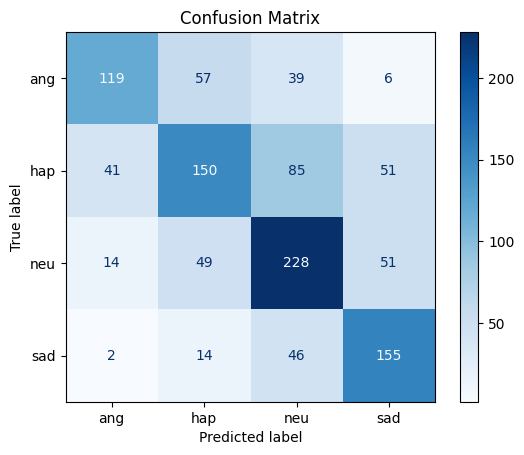


KNN Accuracy: 58.898%
              precision    recall  f1-score   support

           0       0.68      0.54      0.60       221
           1       0.56      0.46      0.50       327
           2       0.57      0.67      0.62       342
           3       0.59      0.71      0.65       217

    accuracy                           0.59      1107
   macro avg       0.60      0.59      0.59      1107
weighted avg       0.59      0.59      0.59      1107



In [21]:
knn_model = KNeighborsClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('KNN',knn_model,iters=500)

Trial: 499
Params: {'apply_smote': False, 'apply_LDA': True, 'n_neighbors': 31, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 43, 'p': 1}
Accuracy = 59.44%

Best so far :
 Trial: 55
Params: {'apply_smote': False, 'apply_LDA': True, 'n_neighbors': 33, 'weights': 'uniform', 'algorithm': 'kd_tree', 'leaf_size': 47, 'p': 1}
Accuracy = 59.98%


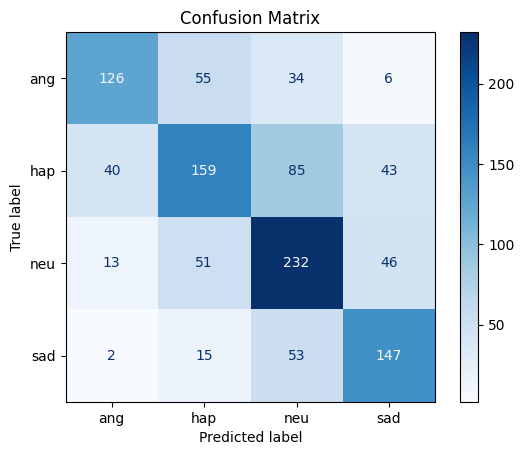


KNN Accuracy: 59.982%
              precision    recall  f1-score   support

           0       0.70      0.57      0.63       221
           1       0.57      0.49      0.52       327
           2       0.57      0.68      0.62       342
           3       0.61      0.68      0.64       217

    accuracy                           0.60      1107
   macro avg       0.61      0.60      0.60      1107
weighted avg       0.60      0.60      0.60      1107


Time taken = 1 min 34 sec



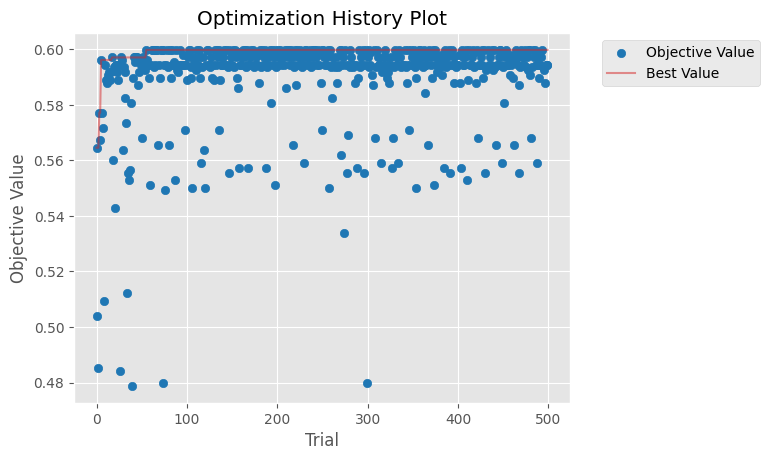

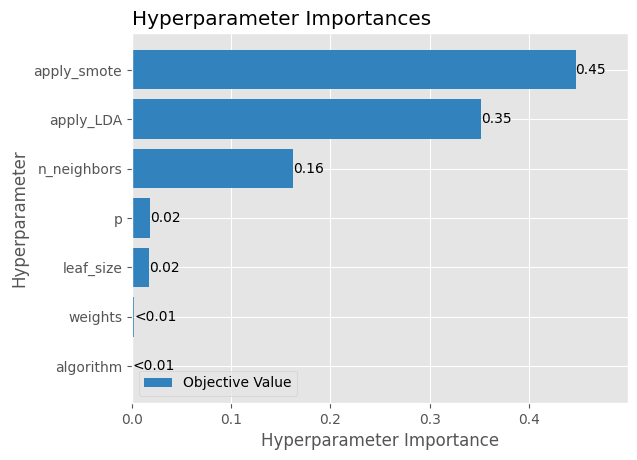

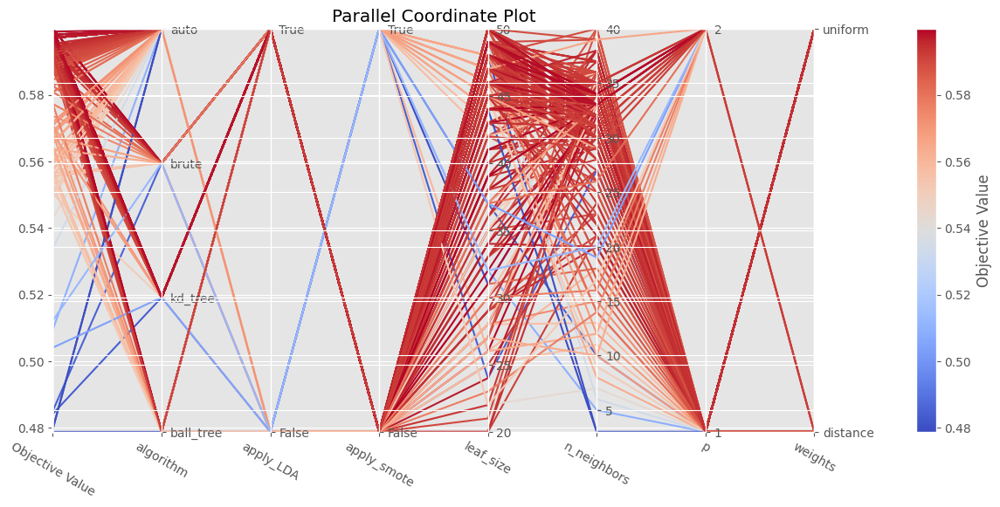

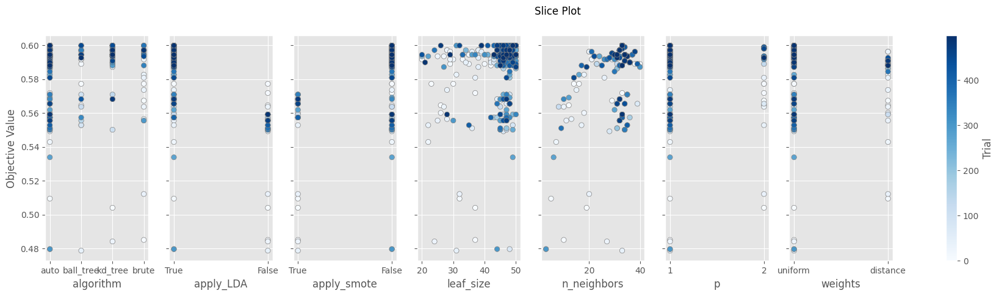

In [11]:
knn_model = KNeighborsClassifier()
res = run_optuna('KNN',knn_model,n_trials=500,rs=7)
visualize_tuning(res['study'])

Trial: 499
Params: {'n_neighbors': 26, 'algorithm': 'auto', 'leaf_size': 40}
Accuracy = 59.98%

Best so far :
 Trial: 10
Params: {'n_neighbors': 26, 'algorithm': 'ball_tree', 'leaf_size': 44}
Accuracy = 59.98%


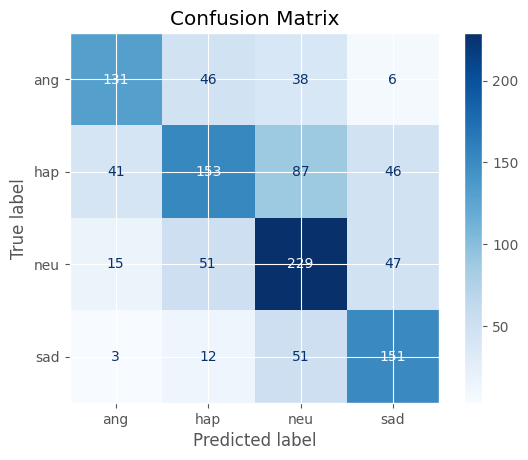


KNN Accuracy: 59.982%
              precision    recall  f1-score   support

           0       0.69      0.59      0.64       221
           1       0.58      0.47      0.52       327
           2       0.57      0.67      0.61       342
           3       0.60      0.70      0.65       217

    accuracy                           0.60      1107
   macro avg       0.61      0.61      0.60      1107
weighted avg       0.60      0.60      0.60      1107


Time taken = 1 min 30 sec



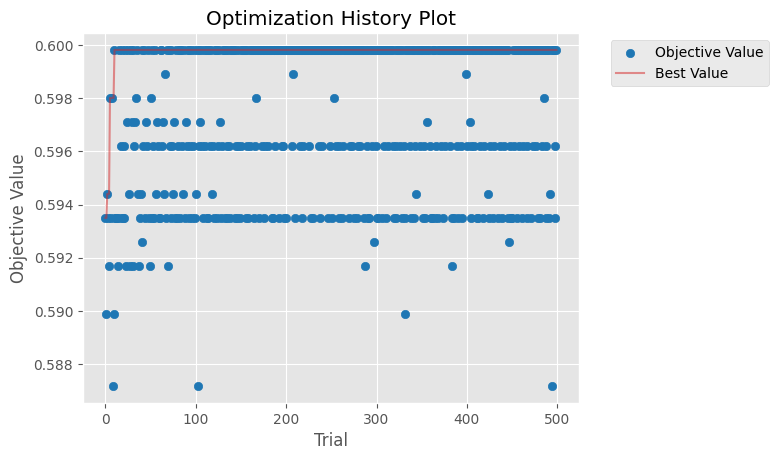

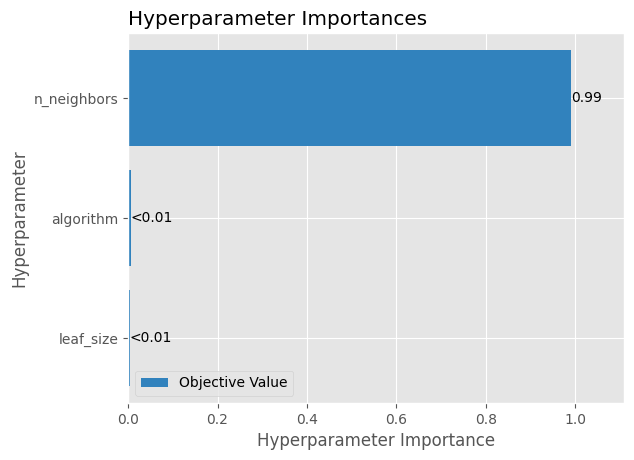

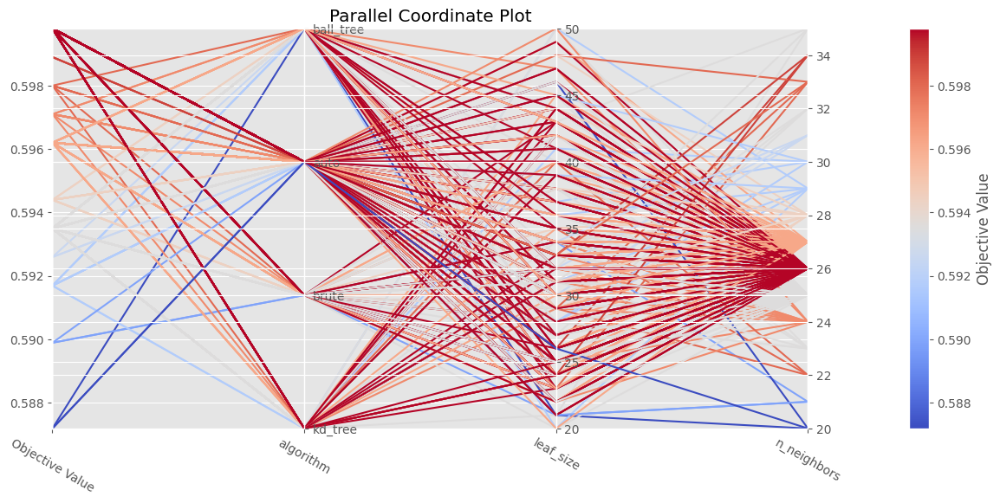

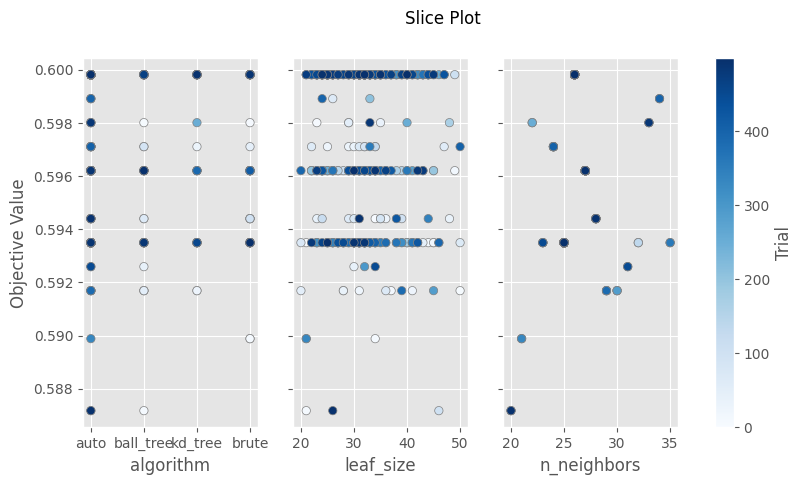

In [18]:
knn_model = KNeighborsClassifier()
sp_params = {'n_neighbors':(20,35),'p':2,'weights':'uniform'}
res = run_optuna('KNN',knn_model,n_trials=500,rs=7,apply_smote=False,apply_LDA=True,sp_params=sp_params)
visualize_tuning(res['study'])

### **Decision Tree Classifier**

Total Time taken = 1 min 2 sec

Current Accuracy = 47.97%
Best Accuracy = 57.27% at iter=208
Best Model Params Found so far = {'criterion': 'log_loss', 'splitter': 'random', 'max_depth': 22, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_features': None, 'random_state': 627}

Best Preprocessing Params Found so far = {'rs': 7, 'apply_smote': False, 'apply_LDA': True}

Hyperparameter Tuning Done!


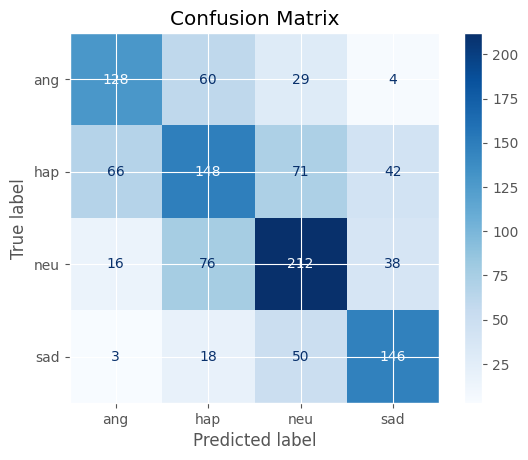


DecisionTree Accuracy: 57.272%
              precision    recall  f1-score   support

         ang       0.60      0.58      0.59       221
         hap       0.49      0.45      0.47       327
         neu       0.59      0.62      0.60       342
         sad       0.63      0.67      0.65       217

    accuracy                           0.57      1107
   macro avg       0.58      0.58      0.58      1107
weighted avg       0.57      0.57      0.57      1107



In [20]:
dt_model = DecisionTreeClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('DecisionTree',dt_model,iters=500,rs=7)

Trial: 499
Params: {'apply_smote': False, 'apply_LDA': True, 'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 4, 'min_samples_split': 17, 'min_samples_leaf': 2, 'max_features': None, 'random_state': 798}
Accuracy = 53.21%

Best so far :
 Trial: 153
Params: {'apply_smote': False, 'apply_LDA': True, 'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 6, 'min_samples_split': 20, 'min_samples_leaf': 6, 'max_features': None, 'random_state': 909}
Accuracy = 57.27%


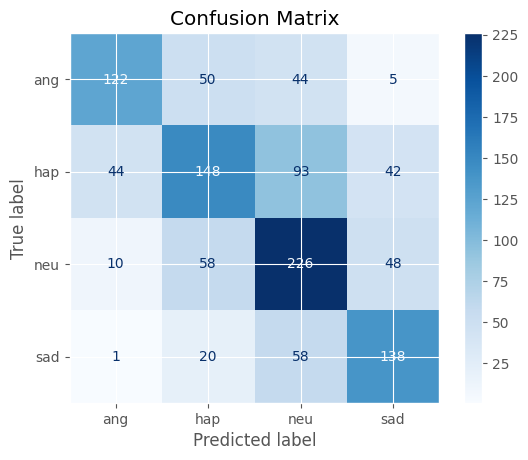


DecisionTree Accuracy: 57.272%
              precision    recall  f1-score   support

         ang       0.69      0.55      0.61       221
         hap       0.54      0.45      0.49       327
         neu       0.54      0.66      0.59       342
         sad       0.59      0.64      0.61       217

    accuracy                           0.57      1107
   macro avg       0.59      0.58      0.58      1107
weighted avg       0.58      0.57      0.57      1107


Time taken = 1 min 25 sec



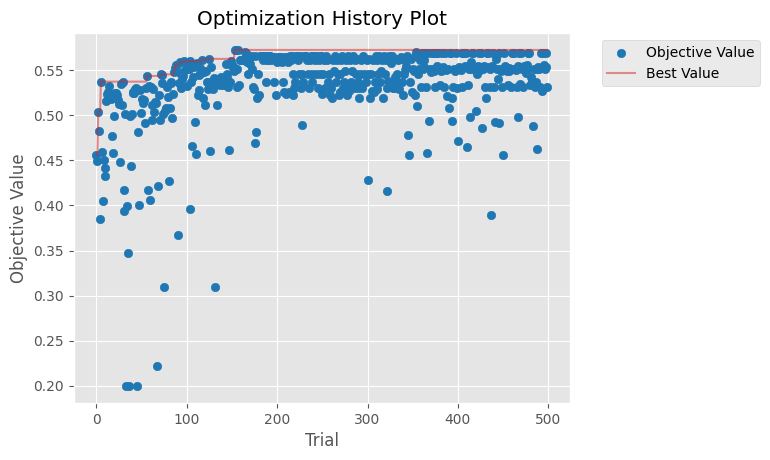

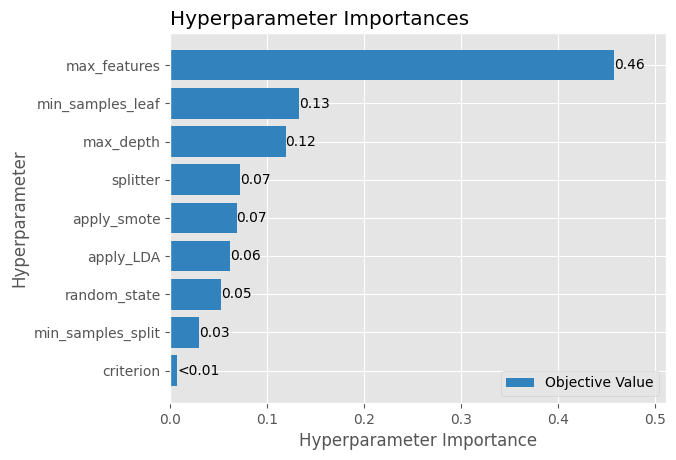

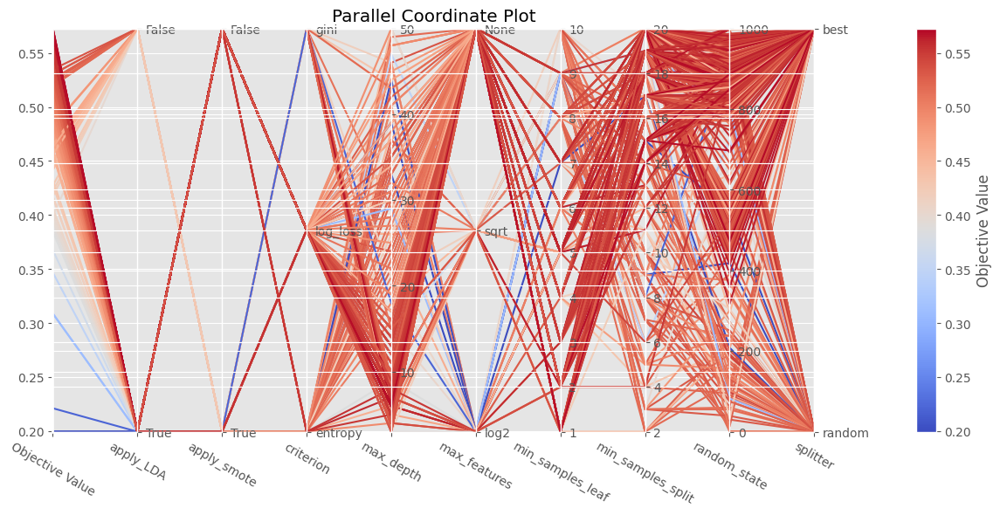

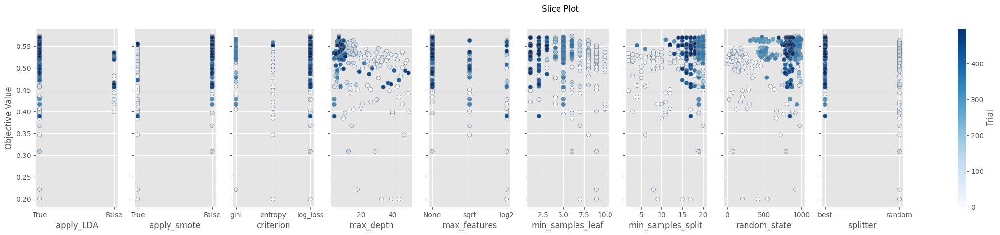

In [23]:
dt_model = DecisionTreeClassifier()
res = run_optuna('DecisionTree',dt_model,n_trials=500,rs=7)
visualize_tuning(res['study'])

Trial: 999
Params: {'apply_smote': False, 'apply_LDA': True, 'criterion': 'gini', 'splitter': 'random', 'max_depth': 41, 'min_samples_split': 14, 'min_samples_leaf': 9, 'random_state': 898}
Accuracy = 52.85%

Best so far :
 Trial: 770
Params: {'apply_smote': False, 'apply_LDA': True, 'criterion': 'gini', 'splitter': 'random', 'max_depth': 38, 'min_samples_split': 15, 'min_samples_leaf': 10, 'random_state': 705}
Accuracy = 58.36%


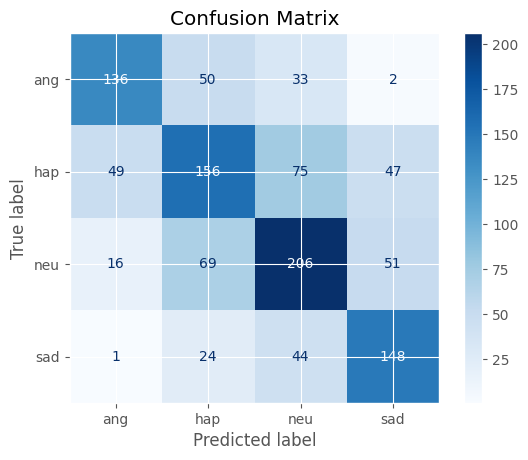


DecisionTree Accuracy: 58.356%
              precision    recall  f1-score   support

         ang       0.67      0.62      0.64       221
         hap       0.52      0.48      0.50       327
         neu       0.58      0.60      0.59       342
         sad       0.60      0.68      0.64       217

    accuracy                           0.58      1107
   macro avg       0.59      0.59      0.59      1107
weighted avg       0.58      0.58      0.58      1107


Time taken = 2 min 54 sec



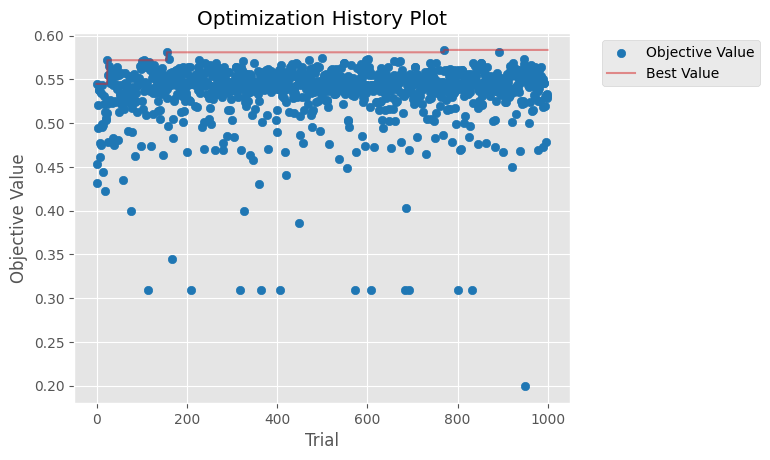

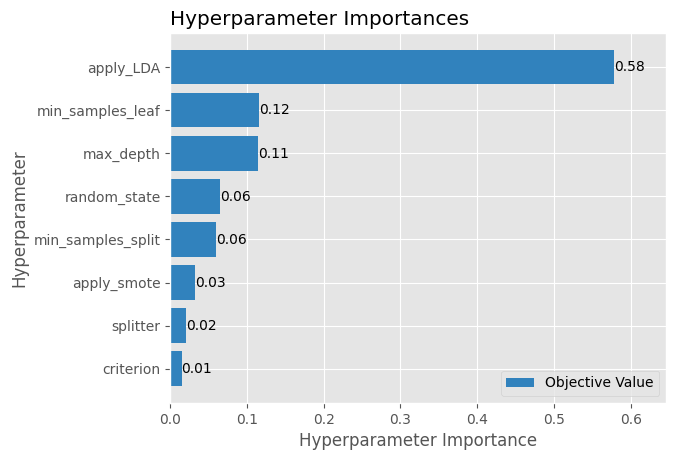

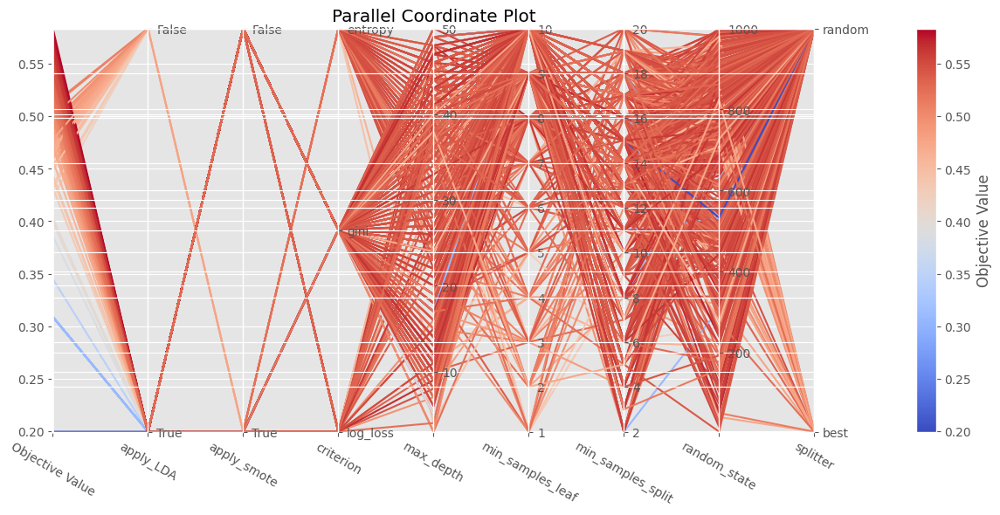

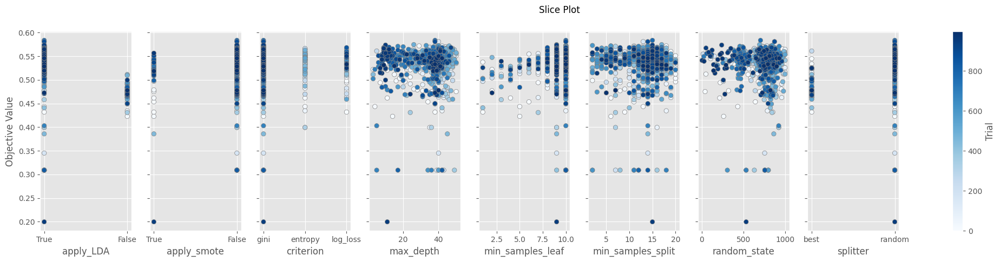

In [26]:
dt_model = DecisionTreeClassifier()
sp_params = {'max_features':None}
res = run_optuna('DecisionTree',dt_model,n_trials=1000,rs=7,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 999
Params: {'apply_smote': False, 'criterion': 'log_loss', 'splitter': 'random', 'max_depth': 22, 'min_samples_split': 3, 'min_samples_leaf': 13, 'random_state': 278}
Accuracy = 55.19%

Best so far :
 Trial: 957
Params: {'apply_smote': False, 'criterion': 'entropy', 'splitter': 'random', 'max_depth': 12, 'min_samples_split': 8, 'min_samples_leaf': 14, 'random_state': 278}
Accuracy = 58.99%


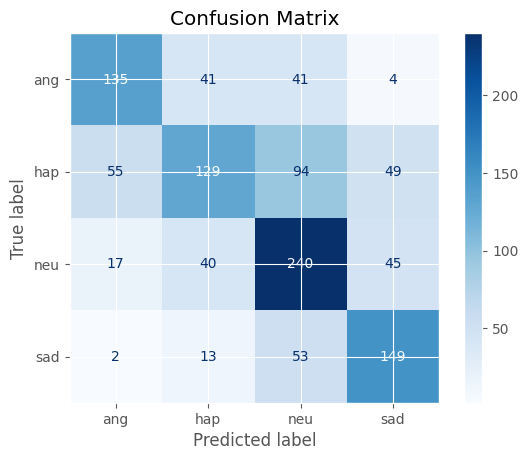


DecisionTree Accuracy: 58.988%
              precision    recall  f1-score   support

         ang       0.65      0.61      0.63       221
         hap       0.58      0.39      0.47       327
         neu       0.56      0.70      0.62       342
         sad       0.60      0.69      0.64       217

    accuracy                           0.59      1107
   macro avg       0.60      0.60      0.59      1107
weighted avg       0.59      0.59      0.58      1107


Time taken = 2 min 52 sec



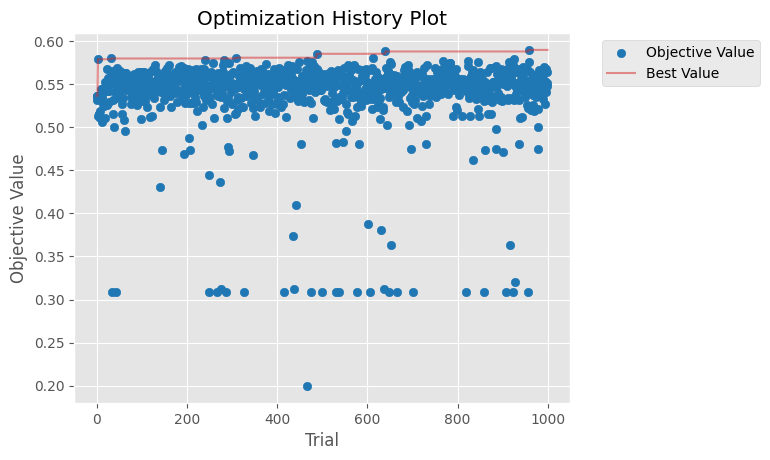

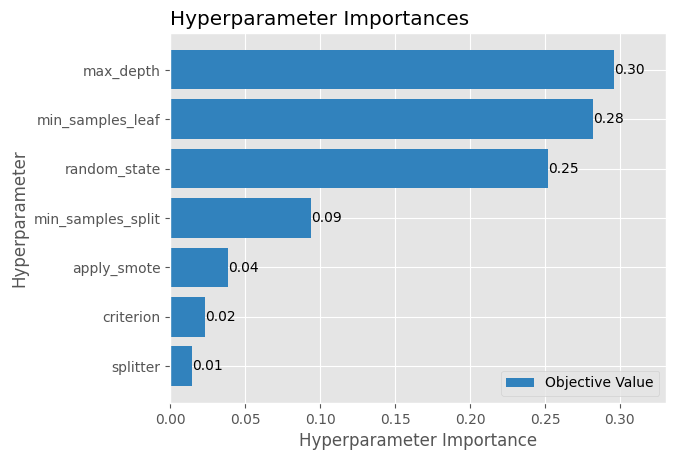

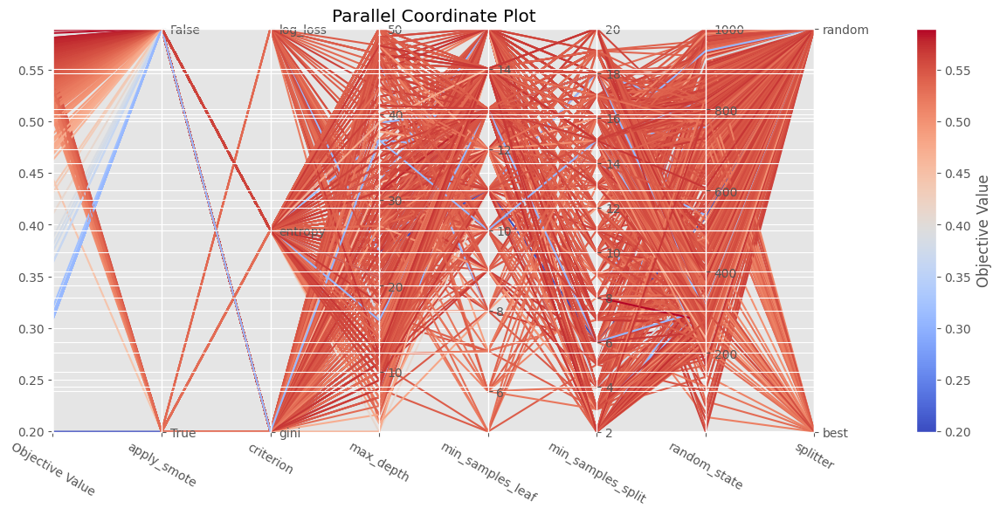

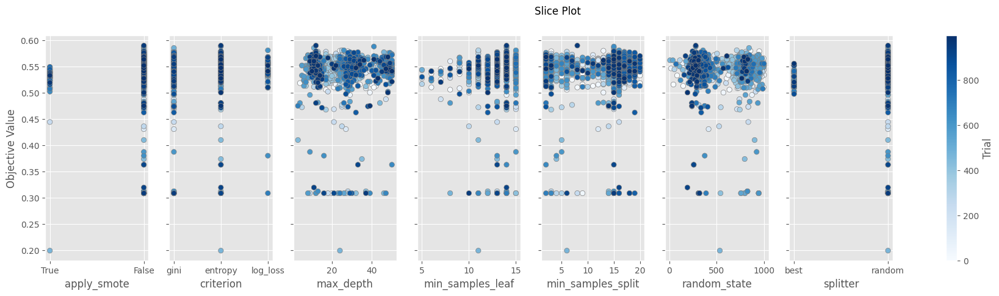

In [27]:
dt_model = DecisionTreeClassifier()
sp_params = {'max_features':None,'min_samples_leaf':(5,15)}
res = run_optuna('DecisionTree',dt_model,n_trials=1000,rs=7,apply_LDA=True,sp_params=sp_params)
visualize_tuning(res['study'])

### **Support Vector Classifier (CuML)**

Total Time taken = 1 min 35 sec

Current Accuracy = 30.89%
Best Accuracy = 58.27% at iter=154
Best Model Params Found so far = {'C': 0.5233975582630028, 'gamma': 0.0001504003366328466, 'coef0': 0.4655140856511536, 'class_weight': 'balanced', 'multiclass_strategy': 'ovo', 'random_state': 729}

Best Preprocessing Params Found so far = {'rs': 7, 'apply_smote': True, 'apply_LDA': True}

Hyperparameter Tuning Done!


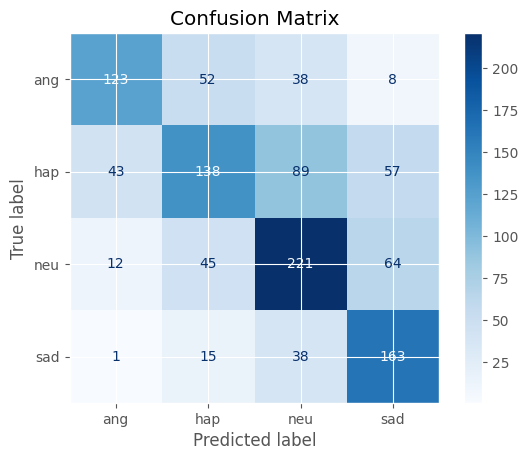


SVM Accuracy: 58.266%
              precision    recall  f1-score   support

           0       0.69      0.56      0.61       221
           1       0.55      0.42      0.48       327
           2       0.57      0.65      0.61       342
           3       0.56      0.75      0.64       217

    accuracy                           0.58      1107
   macro avg       0.59      0.59      0.59      1107
weighted avg       0.59      0.58      0.58      1107



In [31]:
svm_model = cuSVC()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('SVM',svm_model,iters=200,rs=7)

Trial: 499
Params: {'apply_smote': False, 'apply_LDA': False, 'C': 5.26990168249594, 'kernel': 'rbf', 'multiclass_strategy': 'ovo', 'gamma': 'auto', 'coef0': 0.05241299620797045, 'random_state': 25, 'class_weight': 'balanced'}
Accuracy = 61.43%

Best so far :
 Trial: 265
Params: {'apply_smote': False, 'apply_LDA': False, 'C': 5.188986366589229, 'kernel': 'rbf', 'multiclass_strategy': 'ovo', 'gamma': 'auto', 'coef0': 0.018474050554705114, 'random_state': 23, 'class_weight': 'balanced'}
Accuracy = 61.61%


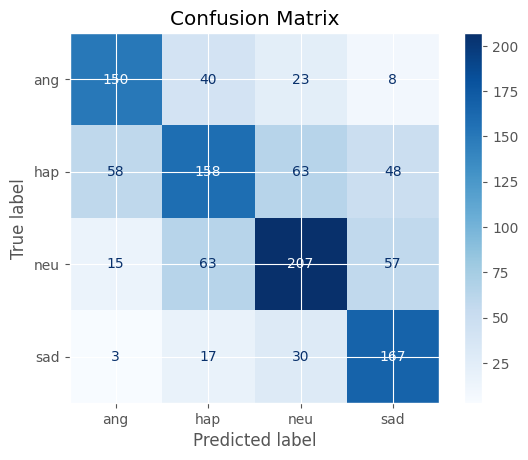


SVM Accuracy: 61.608%
              precision    recall  f1-score   support

           0       0.66      0.68      0.67       221
           1       0.57      0.48      0.52       327
           2       0.64      0.61      0.62       342
           3       0.60      0.77      0.67       217

    accuracy                           0.62      1107
   macro avg       0.62      0.63      0.62      1107
weighted avg       0.62      0.62      0.61      1107


Time taken = 9 min 27 sec



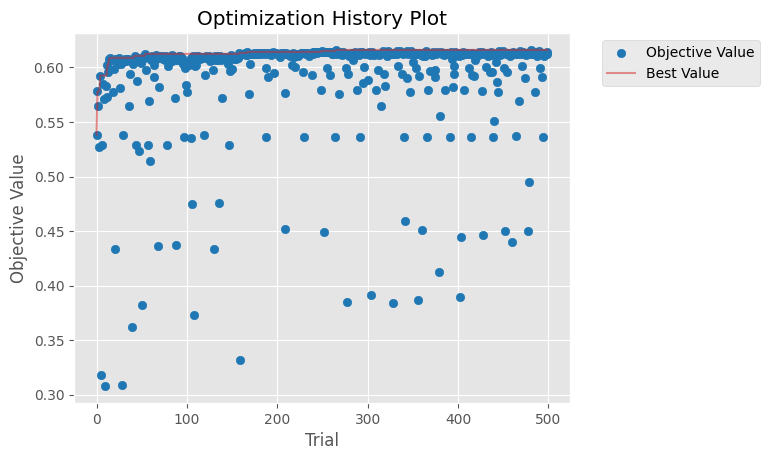

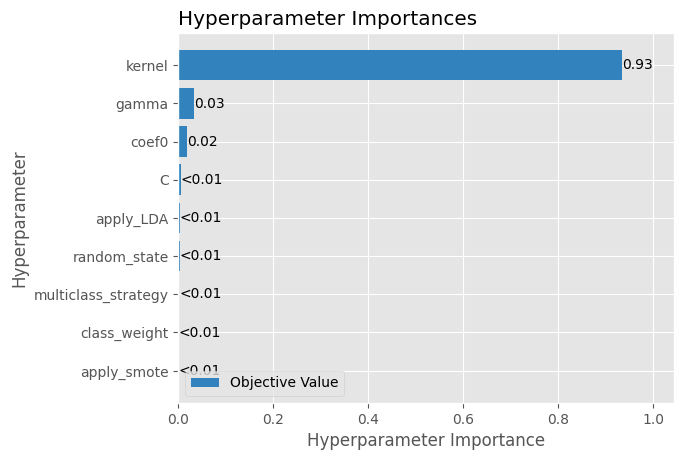

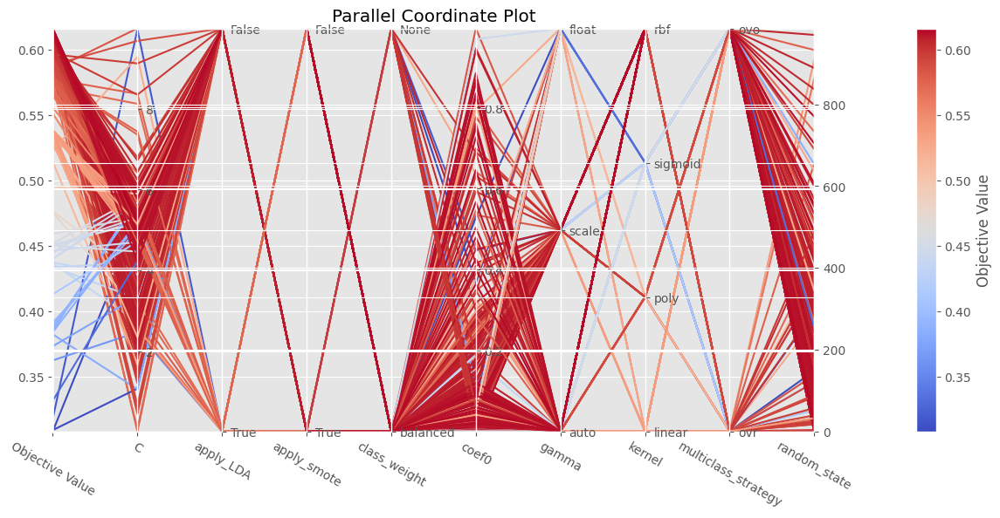

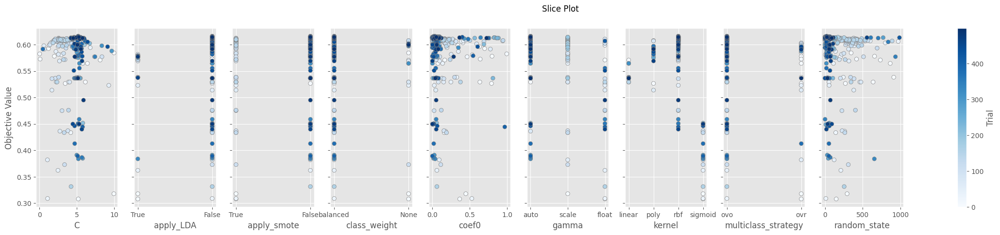

In [33]:
svm_model = cuSVC()
res = run_optuna('SVM',svm_model,n_trials=500,rs=7)
visualize_tuning(res['study'])

Trial: 499
Params: {'apply_smote': False, 'apply_LDA': False, 'C': 5.16952658109228, 'multiclass_strategy': 'ovo', 'gamma': 'auto', 'coef0': 0.8719862834350824, 'random_state': 469, 'class_weight': 'balanced'}
Accuracy = 61.52%

Best so far :
 Trial: 371
Params: {'apply_smote': False, 'apply_LDA': False, 'C': 5.186129409559498, 'multiclass_strategy': 'ovo', 'gamma': 'auto', 'coef0': 0.39501227200166444, 'random_state': 416, 'class_weight': 'balanced'}
Accuracy = 61.61%


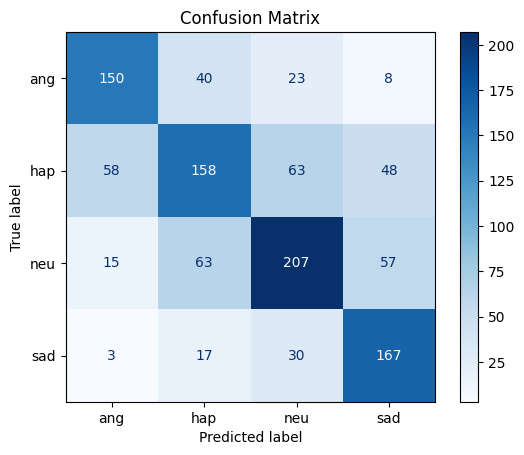


SVM Accuracy: 61.608%
              precision    recall  f1-score   support

           0       0.66      0.68      0.67       221
           1       0.57      0.48      0.52       327
           2       0.64      0.61      0.62       342
           3       0.60      0.77      0.67       217

    accuracy                           0.62      1107
   macro avg       0.62      0.63      0.62      1107
weighted avg       0.62      0.62      0.61      1107


Time taken = 9 min 7 sec



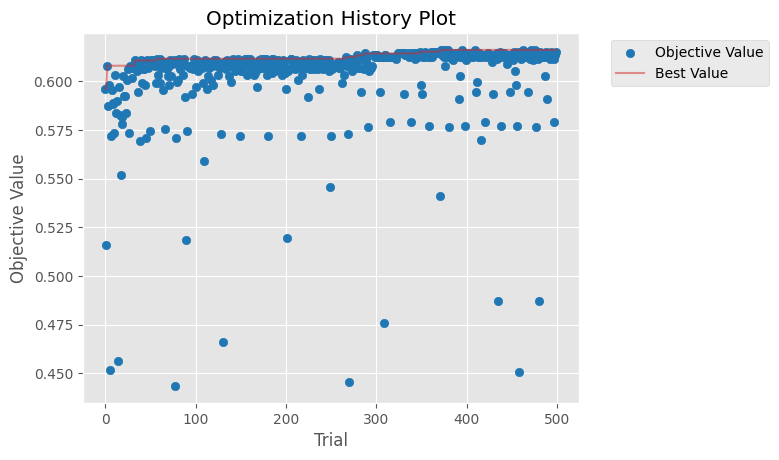

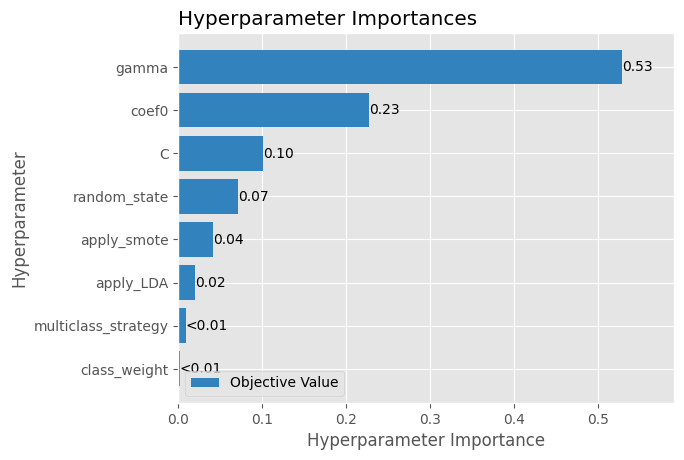

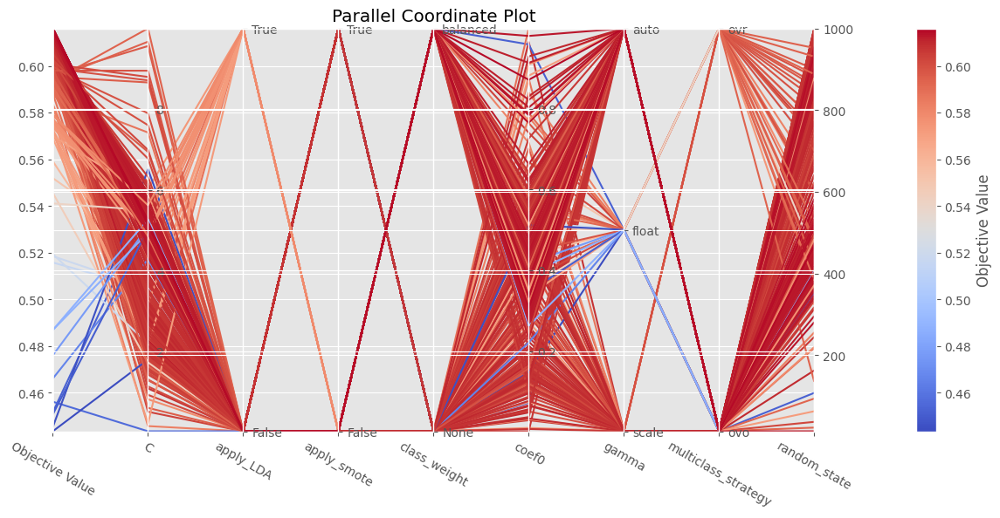

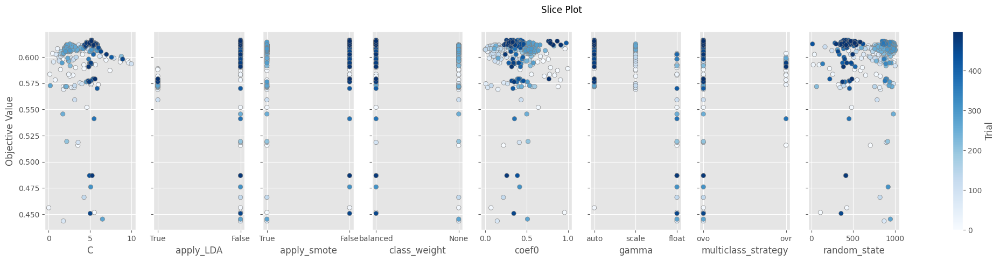

In [11]:
svm_model = cuSVC()
sp_params = {'kernel':'rbf'}
res = run_optuna('SVM',svm_model,n_trials=500,rs=7,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 499
Params: {'apply_smote': False, 'C': 3.345251374710559, 'coef0': 0.5597622204815965, 'random_state': 305, 'class_weight': 'balanced'}
Accuracy = 60.79%

Best so far :
 Trial: 284
Params: {'apply_smote': False, 'C': 5.190389061053919, 'coef0': 0.24586848710397596, 'random_state': 946, 'class_weight': 'balanced'}
Accuracy = 61.61%


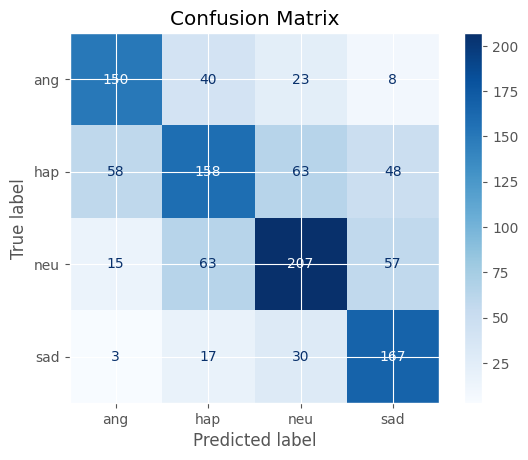


SVM Accuracy: 61.608%
              precision    recall  f1-score   support

           0       0.66      0.68      0.67       221
           1       0.57      0.48      0.52       327
           2       0.64      0.61      0.62       342
           3       0.60      0.77      0.67       217

    accuracy                           0.62      1107
   macro avg       0.62      0.63      0.62      1107
weighted avg       0.62      0.62      0.61      1107


Time taken = 9 min 34 sec



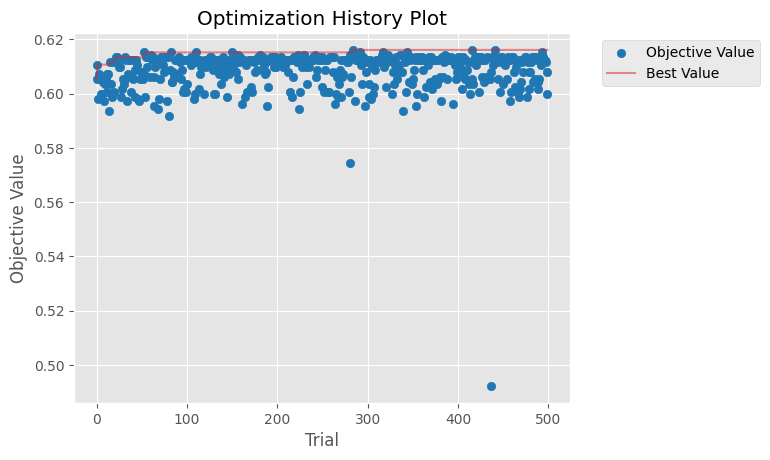

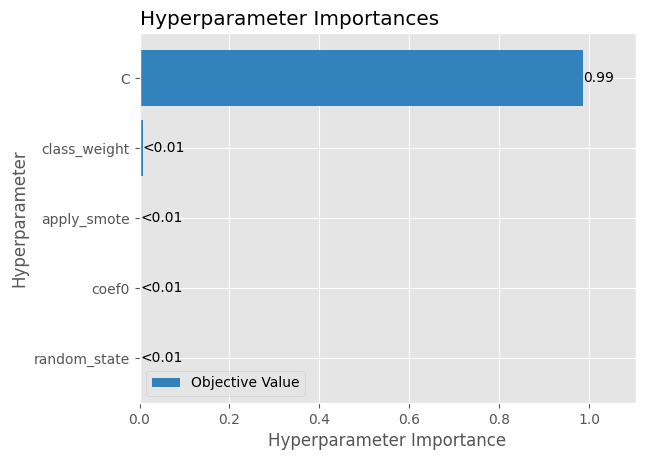

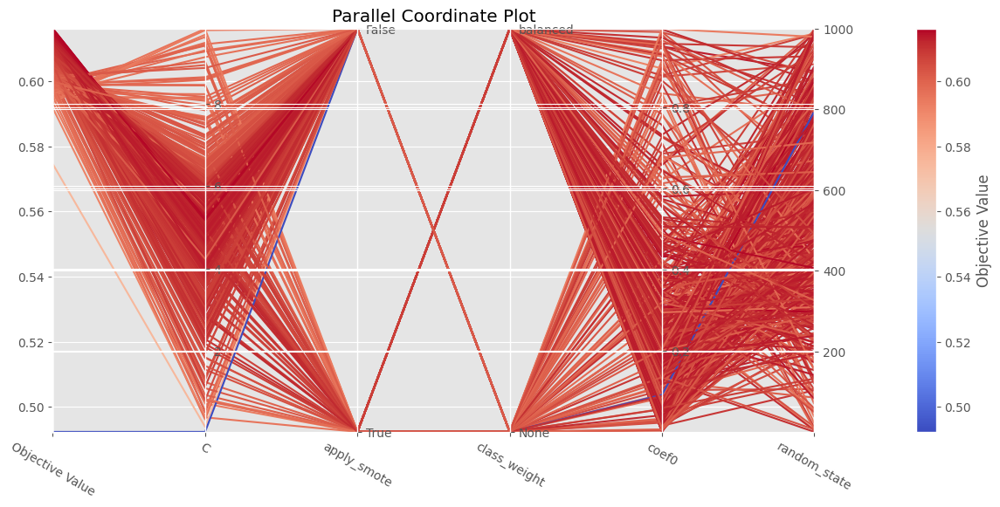

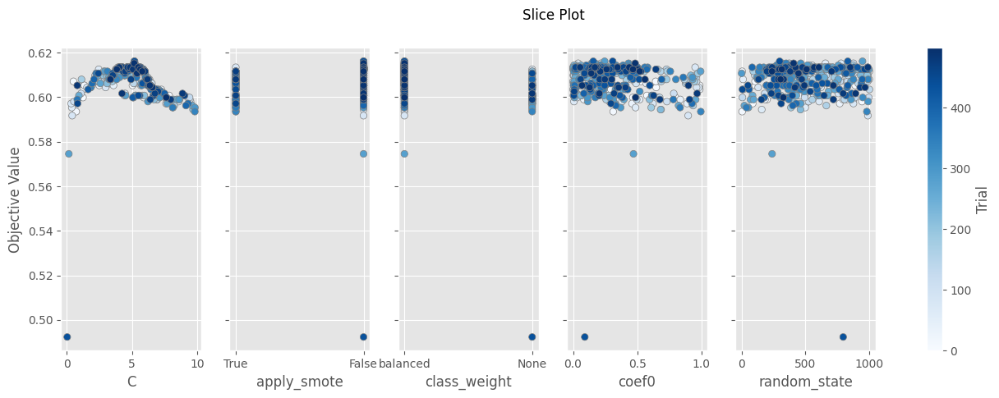

In [17]:
svm_model = cuSVC()
sp_params = {'kernel':'rbf','gamma':'auto','multiclass_strategy':'ovo'}
res = run_optuna('SVM',svm_model,n_trials=500,rs=7,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

### **Logistic Regression**

Total Time taken = 3 min 5 sec

Current Accuracy = 54.56%
Best Accuracy = 58.63% at iter=252
Best Model Params Found so far = {'C': 0.06547148642524357, 'solver': 'lbfgs', 'class_weight': None, 'penalty': 'l2', 'random_state': 163}

Best Preprocessing Params Found so far = {'rs': 7, 'apply_smote': False, 'apply_LDA': False}

Hyperparameter Tuning Done!


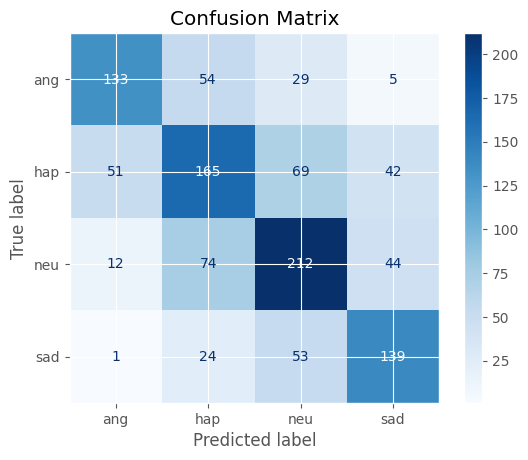


LogisticRegression Accuracy: 58.627%
              precision    recall  f1-score   support

         ang       0.68      0.60      0.64       221
         hap       0.52      0.50      0.51       327
         neu       0.58      0.62      0.60       342
         sad       0.60      0.64      0.62       217

    accuracy                           0.59      1107
   macro avg       0.60      0.59      0.59      1107
weighted avg       0.59      0.59      0.59      1107



In [21]:
lr_model = LogisticRegression(max_iter=1000)
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('LogisticRegression',lr_model,iters=1000,rs=7)

Trial: 999
Params: {'apply_smote': False, 'apply_LDA': True, 'C': 1.2058785789862556, 'solver': 'sag', 'class_weight': None, 'penalty_l2_only': 'l2', 'random_state': 366}
Accuracy = 58.18%

Best so far :
 Trial: 15
Params: {'apply_smote': False, 'apply_LDA': True, 'C': 1.7600087406257874, 'solver': 'sag', 'class_weight': None, 'penalty_l2_only': 'l2', 'random_state': 607}
Accuracy = 58.18%


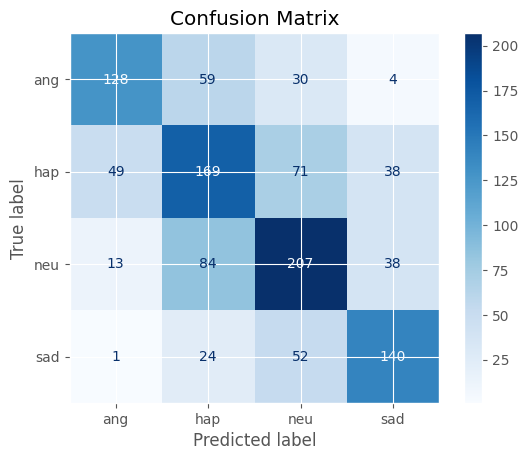


LogisticRegression Accuracy: 58.175%
              precision    recall  f1-score   support

         ang       0.67      0.58      0.62       221
         hap       0.50      0.52      0.51       327
         neu       0.57      0.61      0.59       342
         sad       0.64      0.65      0.64       217

    accuracy                           0.58      1107
   macro avg       0.60      0.59      0.59      1107
weighted avg       0.58      0.58      0.58      1107


Time taken = 2 min 55 sec



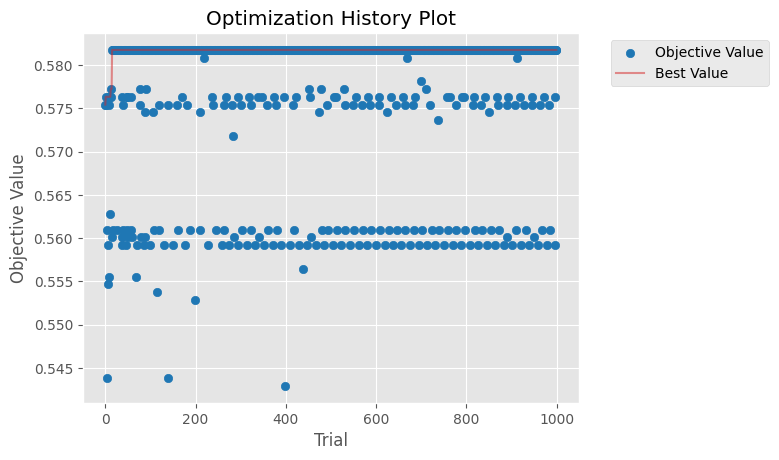

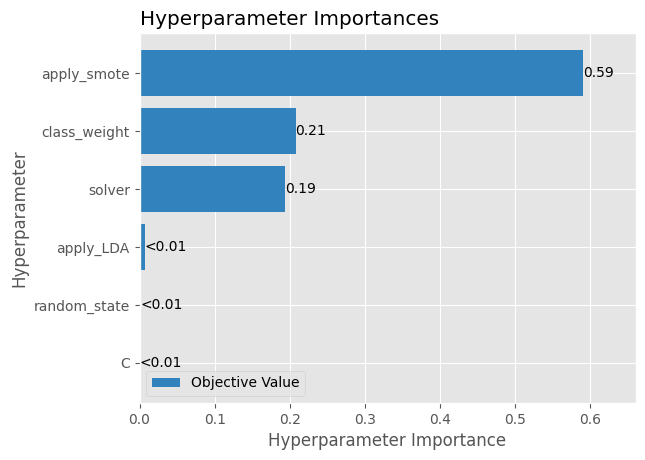

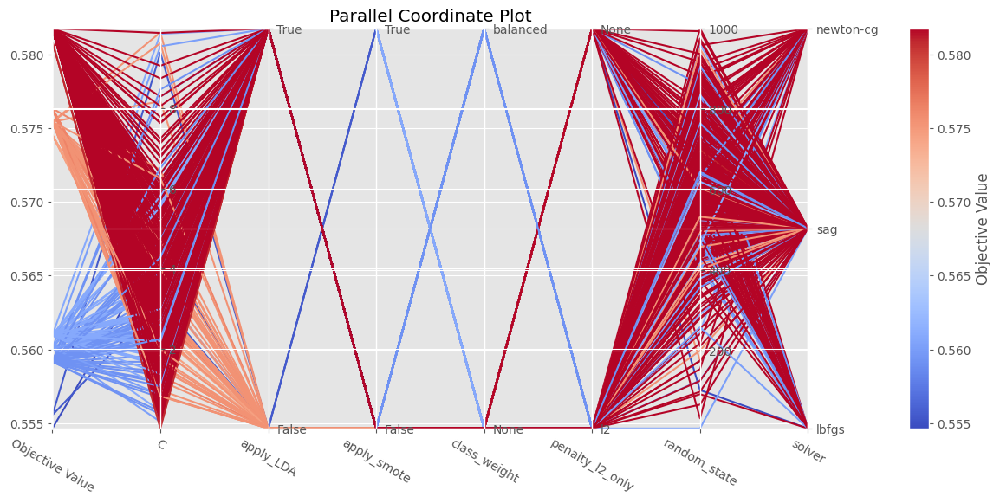

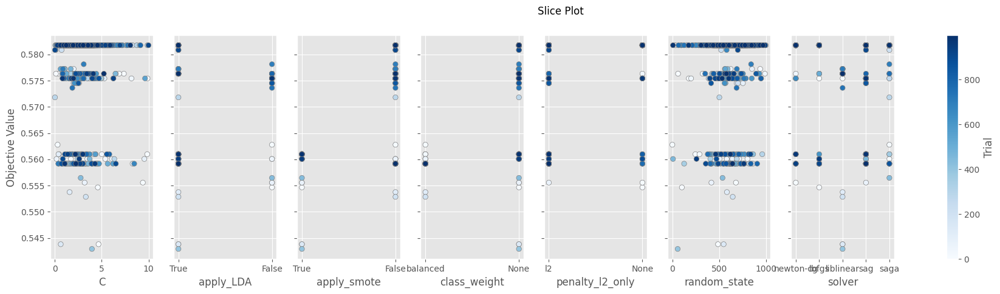

In [24]:
lr_model = LogisticRegression(max_iter=1000)
res = run_optuna('LogisticRegression',lr_model,n_trials=1000,rs=7)
visualize_tuning(res['study'])

Trial: 999
Params: {'C': 4.506275461064386, 'random_state': 303}
Accuracy = 57.54%

Best so far :
 Trial: 42
Params: {'C': 0.06154387437356303, 'random_state': 431}
Accuracy = 58.72%


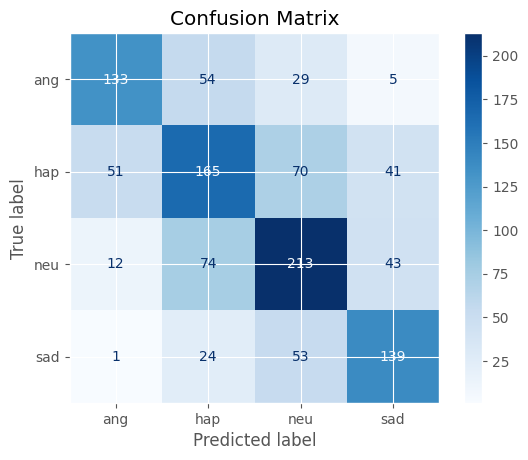


LogisticRegression Accuracy: 58.717%
              precision    recall  f1-score   support

         ang       0.68      0.60      0.64       221
         hap       0.52      0.50      0.51       327
         neu       0.58      0.62      0.60       342
         sad       0.61      0.64      0.62       217

    accuracy                           0.59      1107
   macro avg       0.60      0.59      0.59      1107
weighted avg       0.59      0.59      0.59      1107


Time taken = 5 min 41 sec



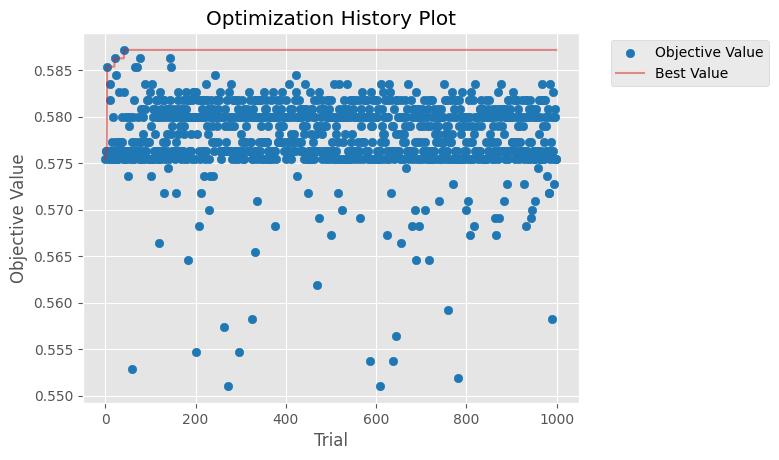

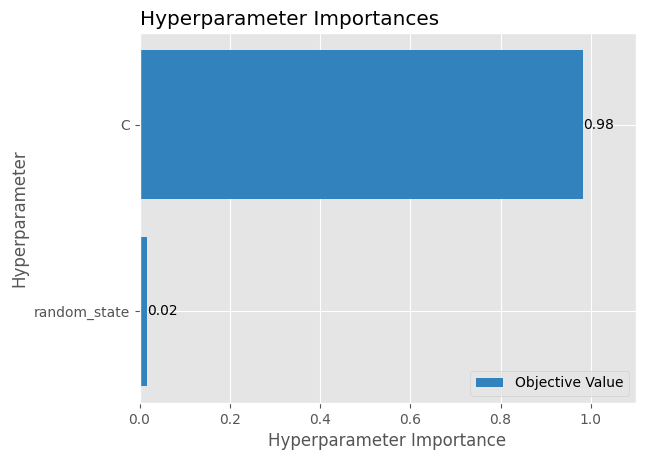

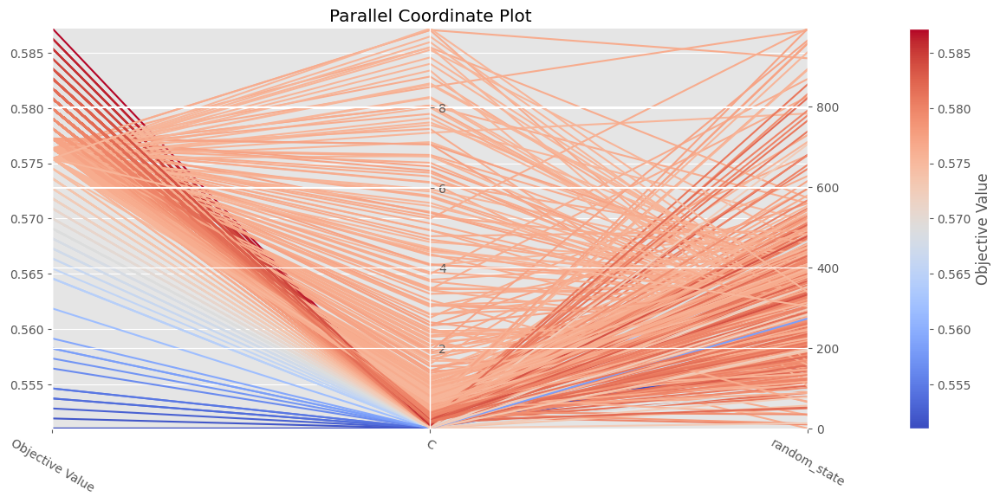

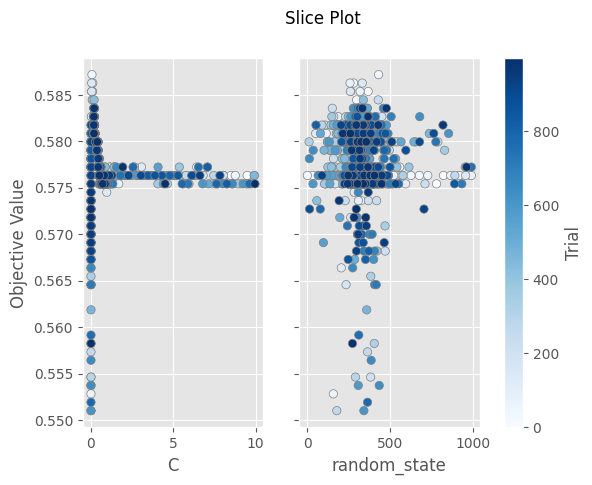

In [33]:
lr_model = LogisticRegression(max_iter=1000)
sp_params = {'class_weight':None,'solver':'lbfgs','penalty':'l2'}
res = run_optuna('LogisticRegression',lr_model,n_trials=1000,rs=7,apply_smote=False,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

Trial: 999
Params: {'C': 0.08444828788052913}
Accuracy = 58.45%

Best so far :
 Trial: 11
Params: {'C': 0.052749559498255404}
Accuracy = 58.81%


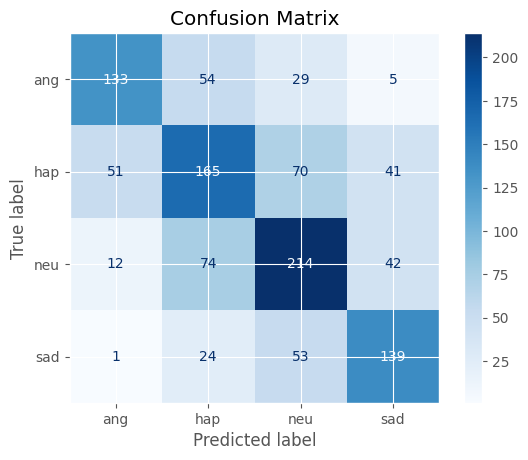


LogisticRegression Accuracy: 58.808%
              precision    recall  f1-score   support

         ang       0.68      0.60      0.64       221
         hap       0.52      0.50      0.51       327
         neu       0.58      0.63      0.60       342
         sad       0.61      0.64      0.63       217

    accuracy                           0.59      1107
   macro avg       0.60      0.59      0.59      1107
weighted avg       0.59      0.59      0.59      1107


Time taken = 5 min 8 sec



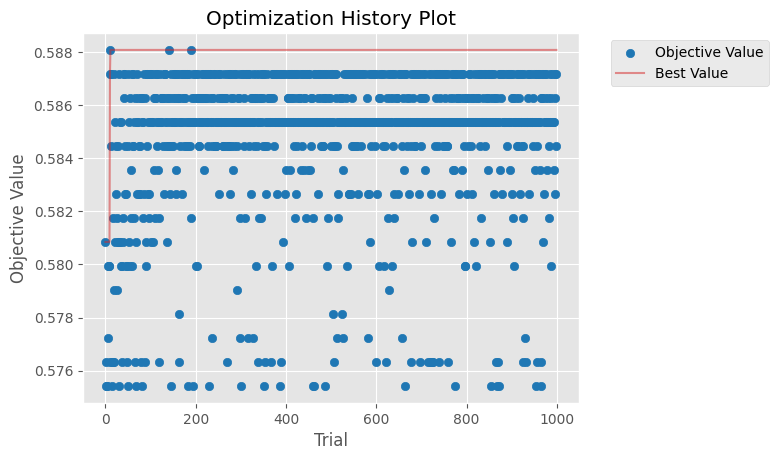

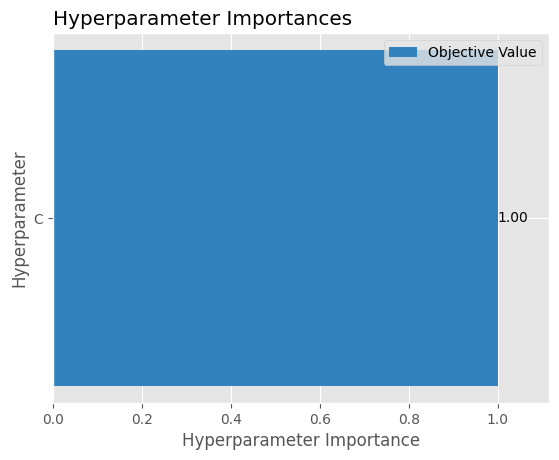

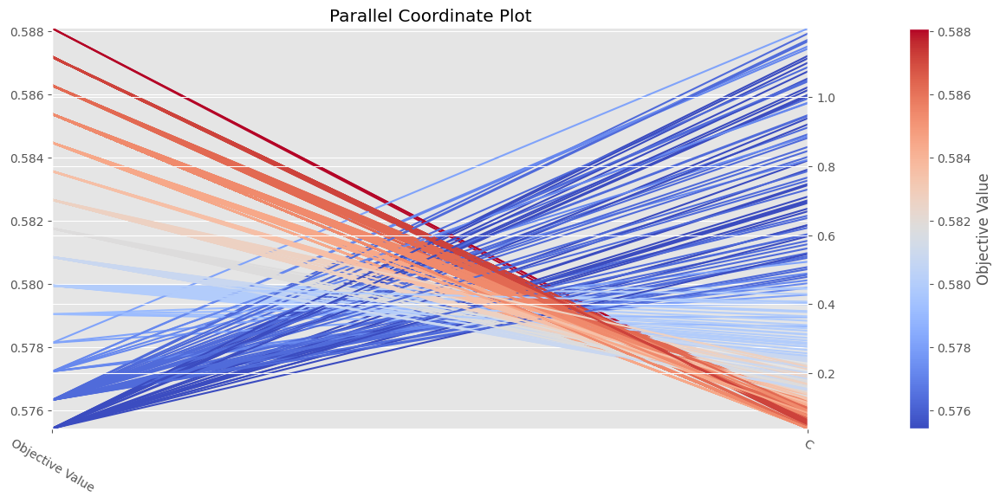

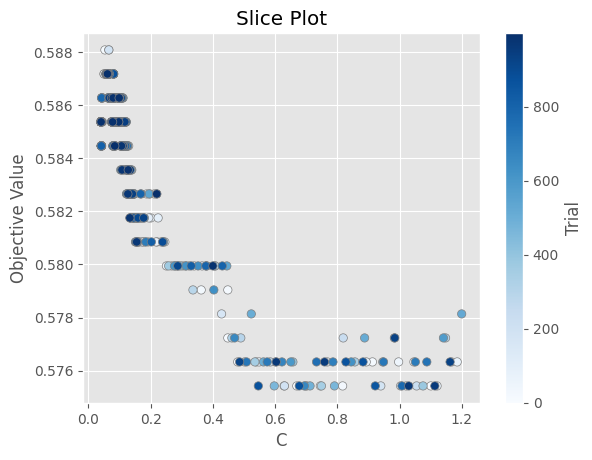

In [39]:
lr_model = LogisticRegression(max_iter=1000)
sp_params = {'class_weight':None,'solver':'lbfgs','penalty':'l2','C':(0.04,1.2),'random_state':None}
res = run_optuna('LogisticRegression',lr_model,n_trials=1000,rs=7,apply_smote=False,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

### **Random Forest Classifier**

Total Time taken = 6 min 32 sec

Current Accuracy = 49.95%
Best Accuracy = 61.07% at iter=3
Best Model Params Found so far = {'n_estimators': 580, 'max_depth': 29, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'bootstrap': False, 'class_weight': 'balanced_subsample', 'random_state': 721}

Best Preprocessing Params Found so far = {'rs': 7, 'apply_smote': False, 'apply_LDA': False}

Hyperparameter Tuning Done!


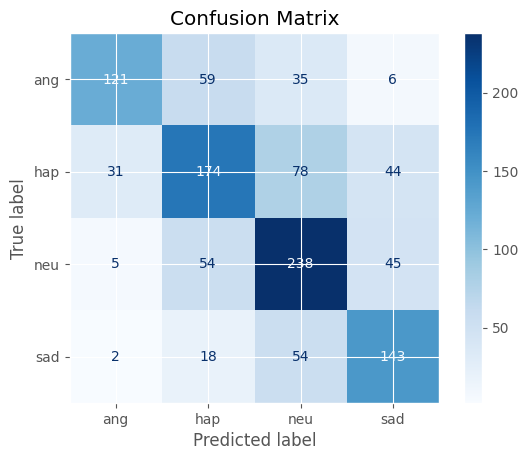


RandomForest Accuracy: 61.066%
              precision    recall  f1-score   support

         ang       0.76      0.55      0.64       221
         hap       0.57      0.53      0.55       327
         neu       0.59      0.70      0.64       342
         sad       0.60      0.66      0.63       217

    accuracy                           0.61      1107
   macro avg       0.63      0.61      0.61      1107
weighted avg       0.62      0.61      0.61      1107



In [42]:
rf_model = RandomForestClassifier()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('RandomForest',rf_model,iters=20,rs=7)

Trial: 19
Params: {'apply_smote': False, 'apply_LDA': False, 'n_estimators': 191, 'max_depth': 44, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'bootstrap': False, 'class_weight': 'balanced_subsample', 'random_state': 622}
Accuracy = 59.80%

Best so far :
 Trial: 14
Params: {'apply_smote': False, 'apply_LDA': False, 'n_estimators': 197, 'max_depth': 42, 'min_samples_split': 16, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'bootstrap': False, 'class_weight': None, 'random_state': 203}
Accuracy = 61.43%


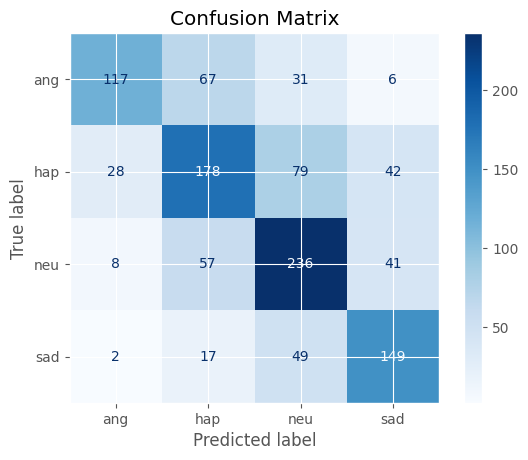


RandomForest Accuracy: 61.427%
              precision    recall  f1-score   support

         ang       0.75      0.53      0.62       221
         hap       0.56      0.54      0.55       327
         neu       0.60      0.69      0.64       342
         sad       0.63      0.69      0.65       217

    accuracy                           0.61      1107
   macro avg       0.63      0.61      0.62      1107
weighted avg       0.62      0.61      0.61      1107


Time taken = 3 min 10 sec



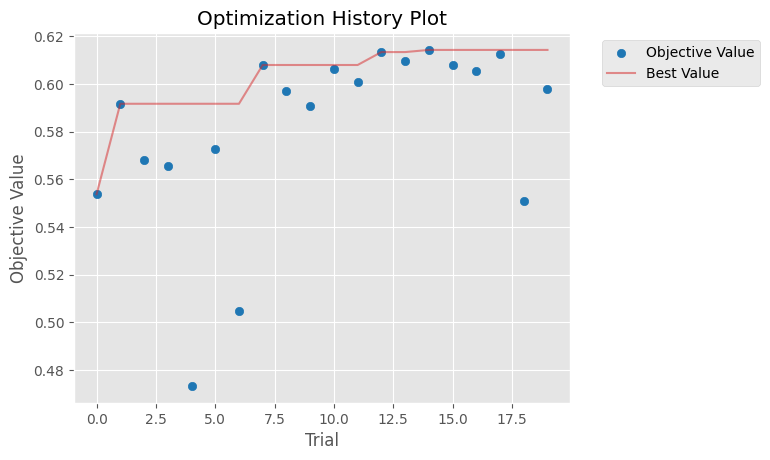

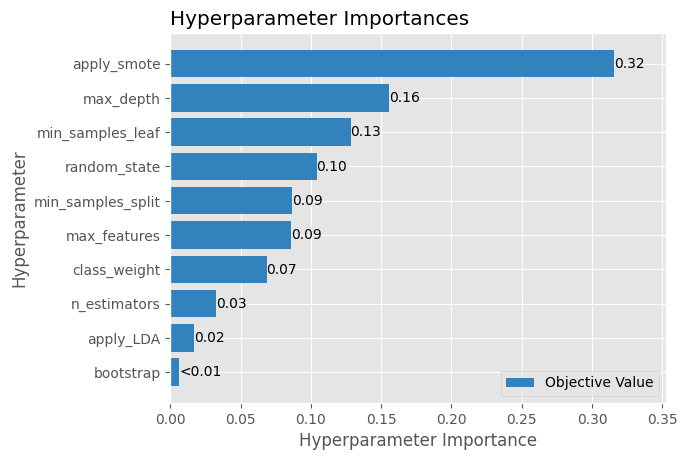

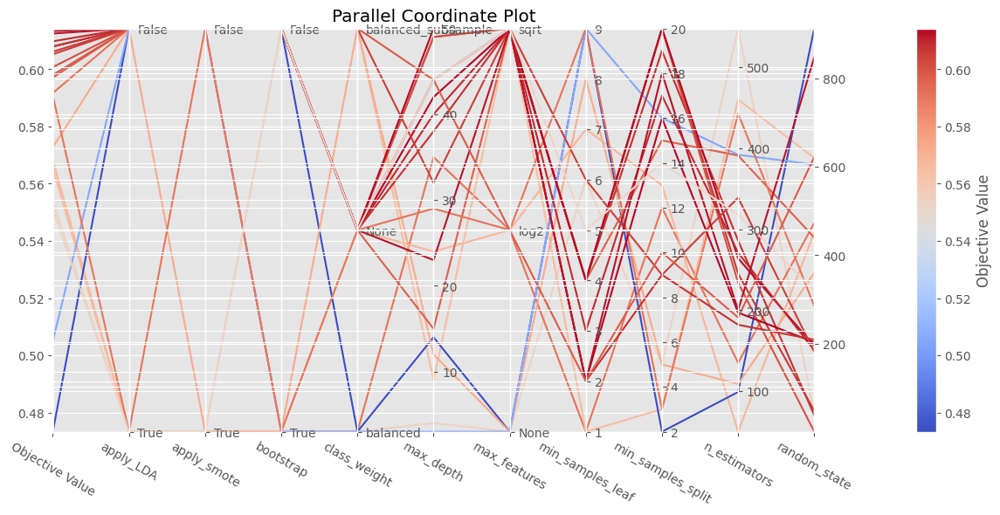

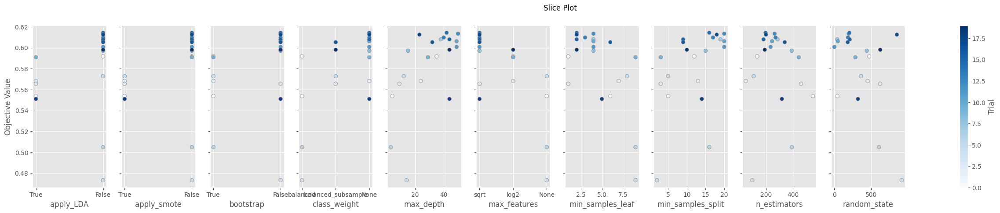

In [44]:
rf_model = RandomForestClassifier()
#sp_params = {'n_estimators':(50,300)}
res = run_optuna('RandomForest',rf_model,n_trials=20,rs=7)
visualize_tuning(res['study'])

Trial: 29
Params: {'n_estimators': 402, 'max_depth': 21, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': False, 'class_weight': 'balanced_subsample', 'random_state': 188}
Accuracy = 62.42%

Best so far :
 Trial: 29
Params: {'n_estimators': 402, 'max_depth': 21, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_features': 'log2', 'bootstrap': False, 'class_weight': 'balanced_subsample', 'random_state': 188}
Accuracy = 62.42%


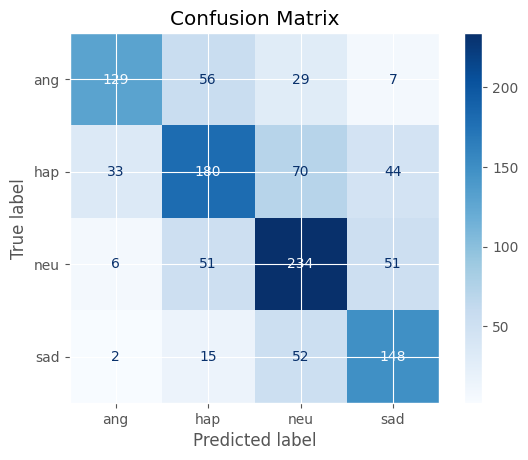


RandomForest Accuracy: 62.421%
              precision    recall  f1-score   support

         ang       0.76      0.58      0.66       221
         hap       0.60      0.55      0.57       327
         neu       0.61      0.68      0.64       342
         sad       0.59      0.68      0.63       217

    accuracy                           0.62      1107
   macro avg       0.64      0.63      0.63      1107
weighted avg       0.63      0.62      0.62      1107


Time taken = 8 min 56 sec



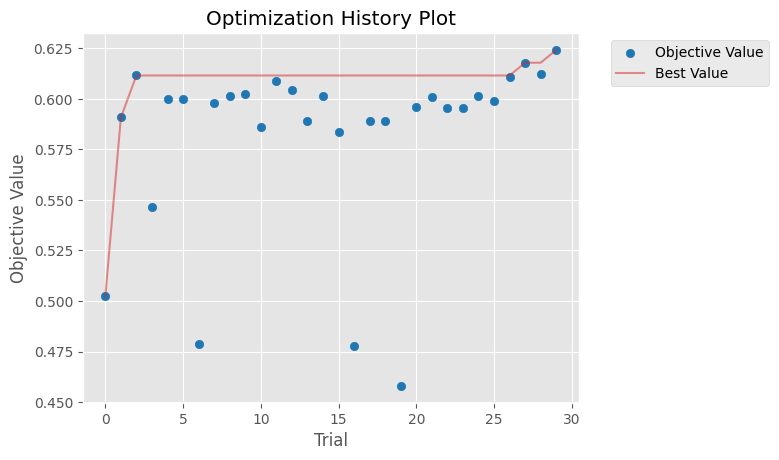

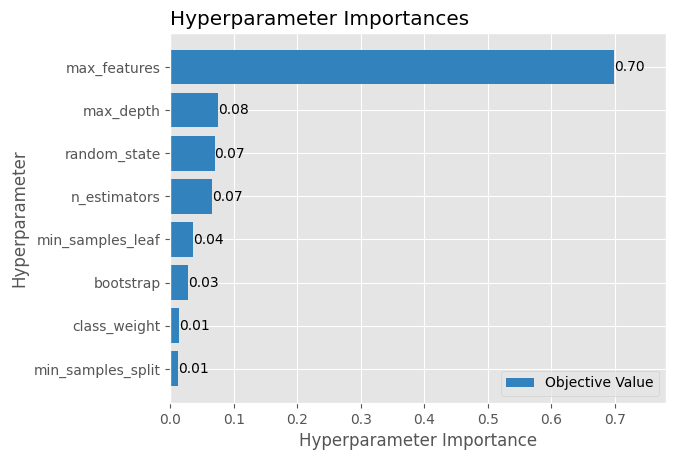

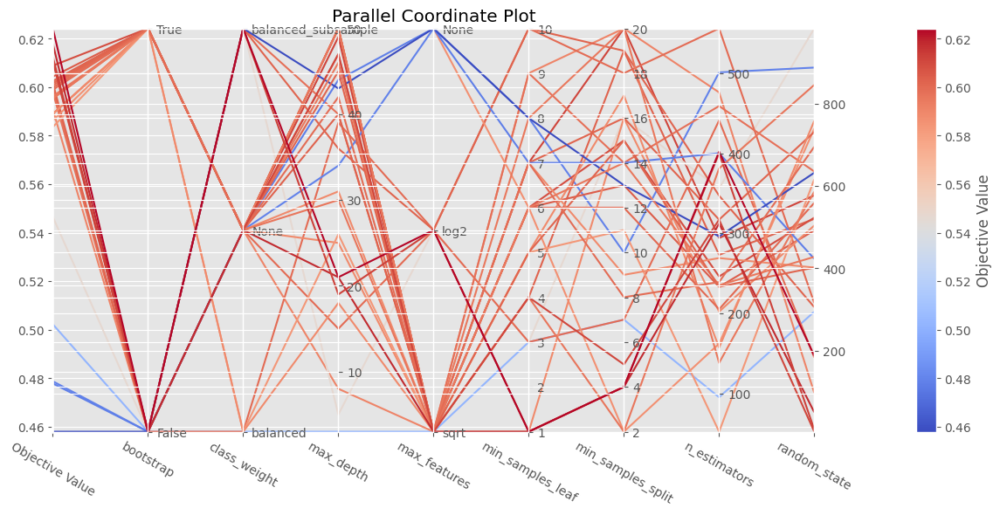

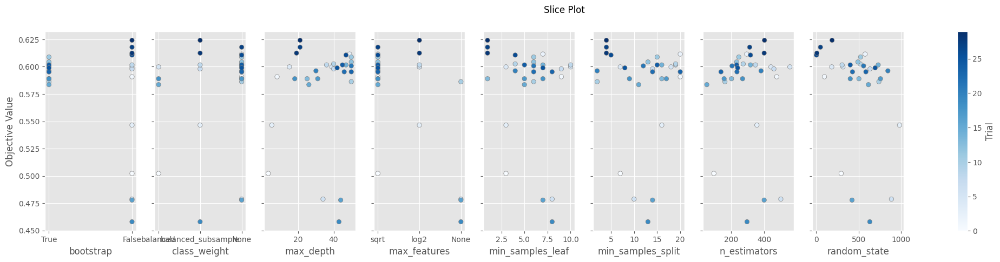

In [45]:
rf_model = RandomForestClassifier()
res = run_optuna('RandomForest',rf_model,n_trials=30,rs=7,apply_smote=False,apply_LDA=False)
visualize_tuning(res['study'])

Trial: 49
Params: {'n_estimators': 52, 'max_depth': 26, 'min_samples_split': 12, 'min_samples_leaf': 1, 'class_weight': 'balanced_subsample'}
Accuracy = 56.82%

Best so far :
 Trial: 35
Params: {'n_estimators': 263, 'max_depth': 28, 'min_samples_split': 3, 'min_samples_leaf': 1, 'class_weight': 'balanced_subsample'}
Accuracy = 62.78%


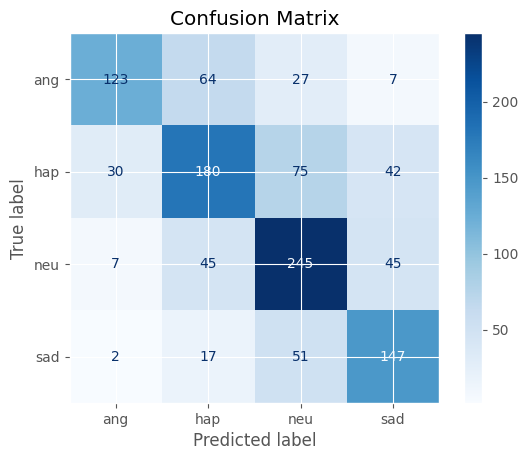


RandomForest Accuracy: 62.782%
              precision    recall  f1-score   support

         ang       0.76      0.56      0.64       221
         hap       0.59      0.55      0.57       327
         neu       0.62      0.72      0.66       342
         sad       0.61      0.68      0.64       217

    accuracy                           0.63      1107
   macro avg       0.64      0.63      0.63      1107
weighted avg       0.64      0.63      0.63      1107


Time taken = 8 min 11 sec



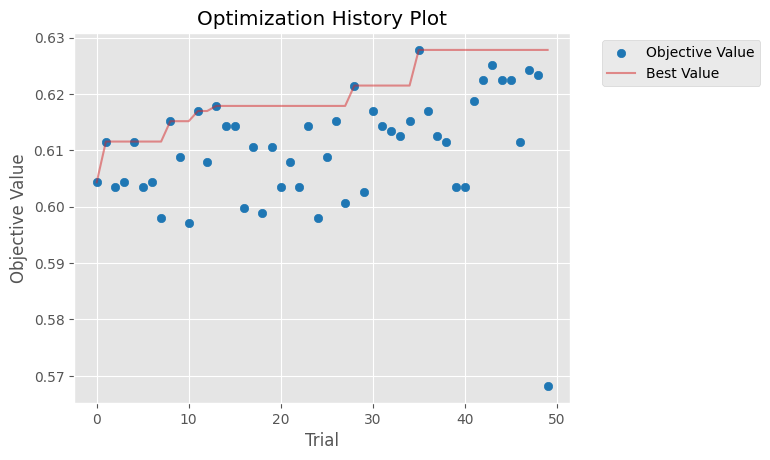

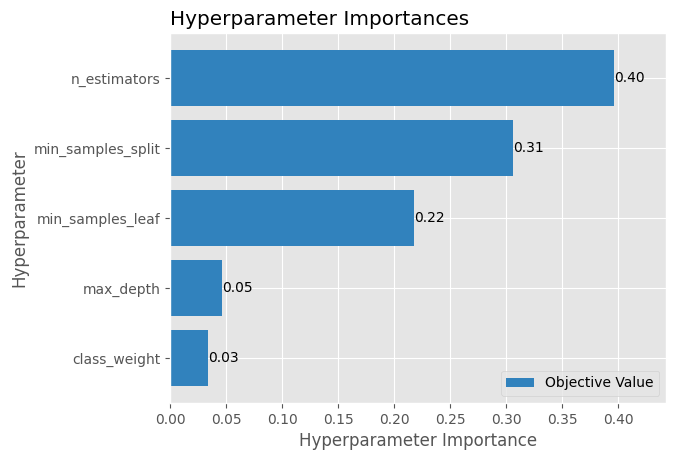

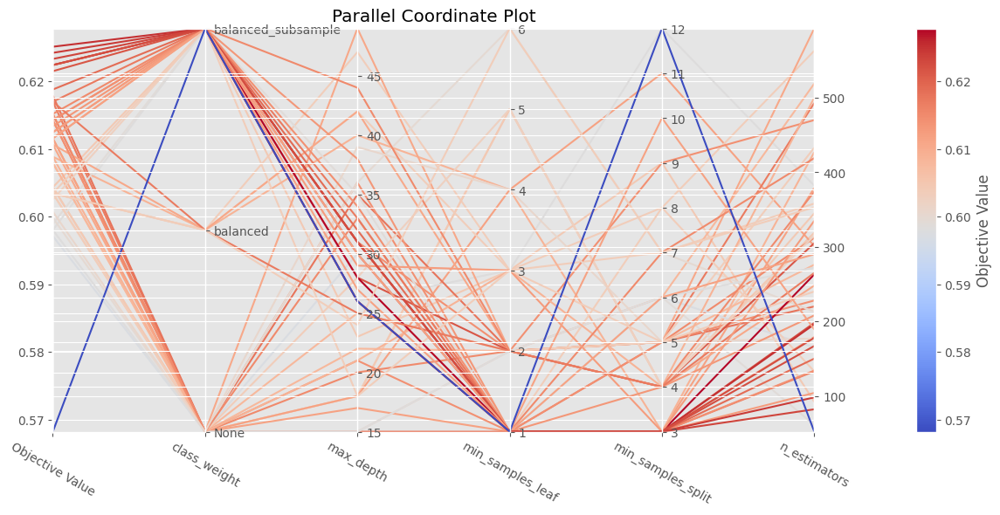

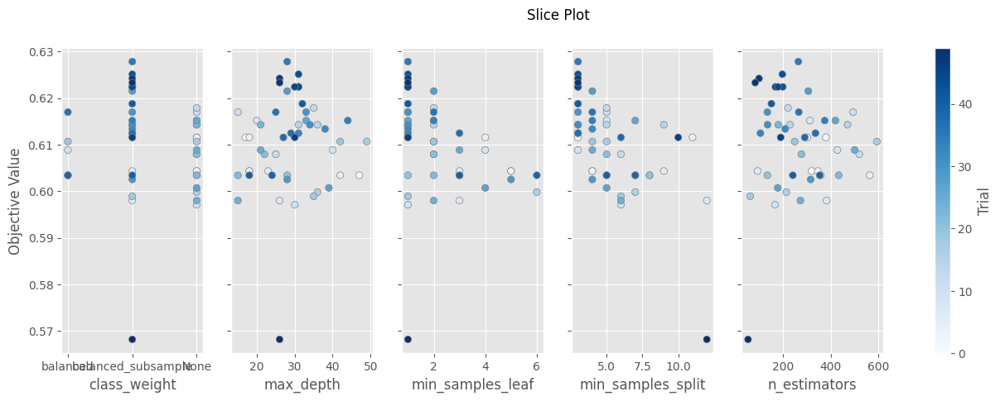

In [50]:
rf_model = RandomForestClassifier()
sp_params = {'max_depth':(15,50),'max_features':'log2','bootstrap':False,'random_state':188,
             'min_samples_leaf':(1,6),'min_samples_split':(3,12)}
res = run_optuna('RandomForest',rf_model,n_trials=50,rs=7,apply_smote=False,apply_LDA=False,sp_params=sp_params)
visualize_tuning(res['study'])

### **Extreme Gradient Boosting Classifier (XGBoost)**

Total Time taken = 3 min 54 sec

Current Accuracy = 56.28%
Best Accuracy = 61.79% at iter=62
Best Model Params Found so far = {'learning_rate': 0.012014299611712416, 'n_estimators': 181, 'max_depth': 13, 'min_child_weight': 2, 'gamma': 0.8127989785159582, 'subsample': 0.974293510479048, 'colsample_bytree': 0.7413401275661042, 'reg_alpha': 0.6900221043688911, 'reg_lambda': 0.2367902649153486, 'scale_pos_weight': 6.284389288600139, 'random_state': 794}

Best Preprocessing Params Found so far = {'rs': 7, 'apply_smote': False, 'apply_LDA': False}

Hyperparameter Tuning Done!


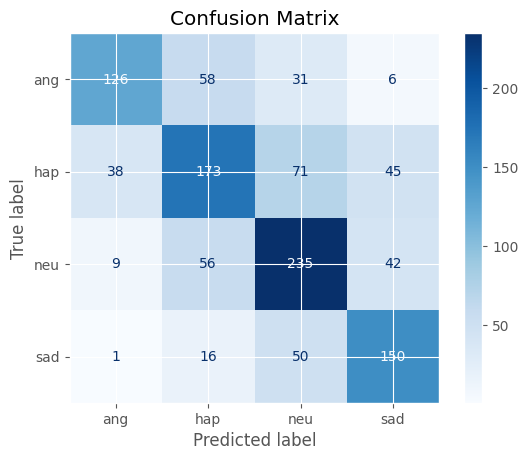


XGBoost Accuracy: 61.789%
              precision    recall  f1-score   support

           0       0.72      0.57      0.64       221
           1       0.57      0.53      0.55       327
           2       0.61      0.69      0.64       342
           3       0.62      0.69      0.65       217

    accuracy                           0.62      1107
   macro avg       0.63      0.62      0.62      1107
weighted avg       0.62      0.62      0.62      1107



In [52]:
xgb_model = XGBClassifier(device='cuda')
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('XGBoost',xgb_model,iters=200,rs=7)

Trial: 199
Params: {'apply_smote': False, 'apply_LDA': False, 'learning_rate': 0.07330321202603365, 'n_estimators': 112, 'max_depth': 10, 'min_child_weight': 10, 'gamma': 0.7382538473935689, 'subsample': 0.8050478611214956, 'colsample_bytree': 0.6827581629608523, 'reg_alpha': 0.30442659644753145, 'reg_lambda': 0.4610074007787537, 'scale_pos_weight': 11.907350062969012, 'random_state': 792}
Accuracy = 60.07%

Best so far :
 Trial: 135
Params: {'apply_smote': False, 'apply_LDA': False, 'learning_rate': 0.030974874074581424, 'n_estimators': 77, 'max_depth': 12, 'min_child_weight': 8, 'gamma': 0.7985891108958272, 'subsample': 0.4501533163484101, 'colsample_bytree': 0.6849584567892871, 'reg_alpha': 0.35410584266337236, 'reg_lambda': 0.6928914454045639, 'scale_pos_weight': 14.194883843916262, 'random_state': 571}
Accuracy = 62.06%


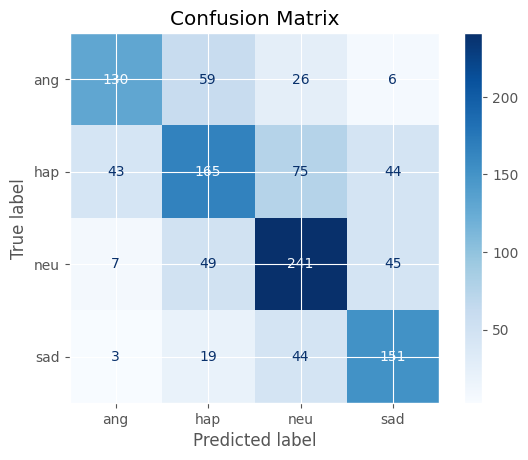


XGBoost Accuracy: 62.060%
              precision    recall  f1-score   support

           0       0.71      0.59      0.64       221
           1       0.57      0.50      0.53       327
           2       0.62      0.70      0.66       342
           3       0.61      0.70      0.65       217

    accuracy                           0.62      1107
   macro avg       0.63      0.62      0.62      1107
weighted avg       0.62      0.62      0.62      1107


Time taken = 4 min 38 sec



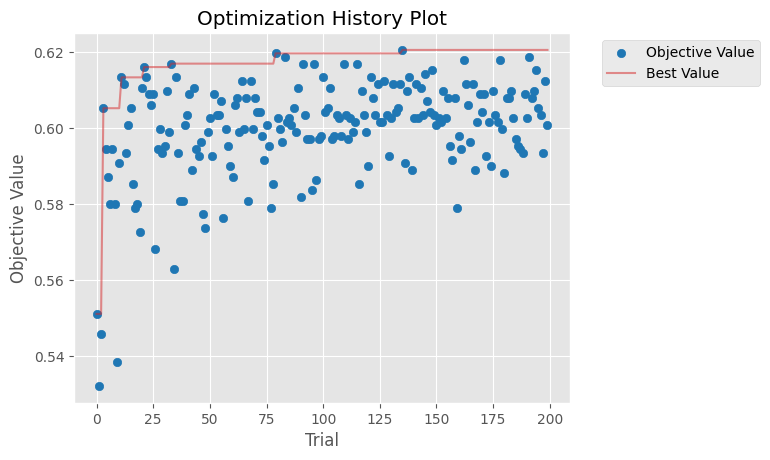

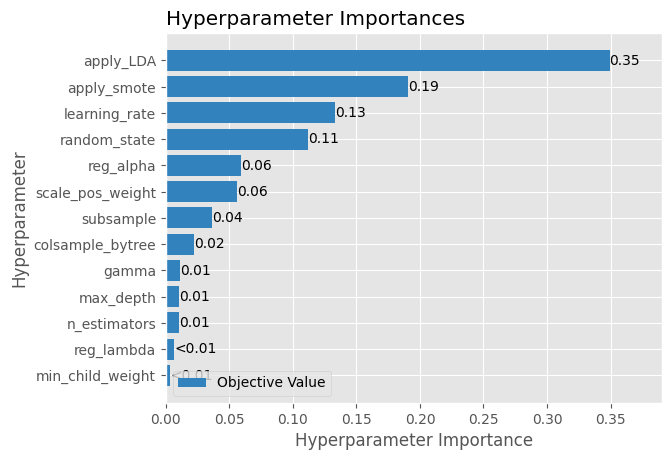

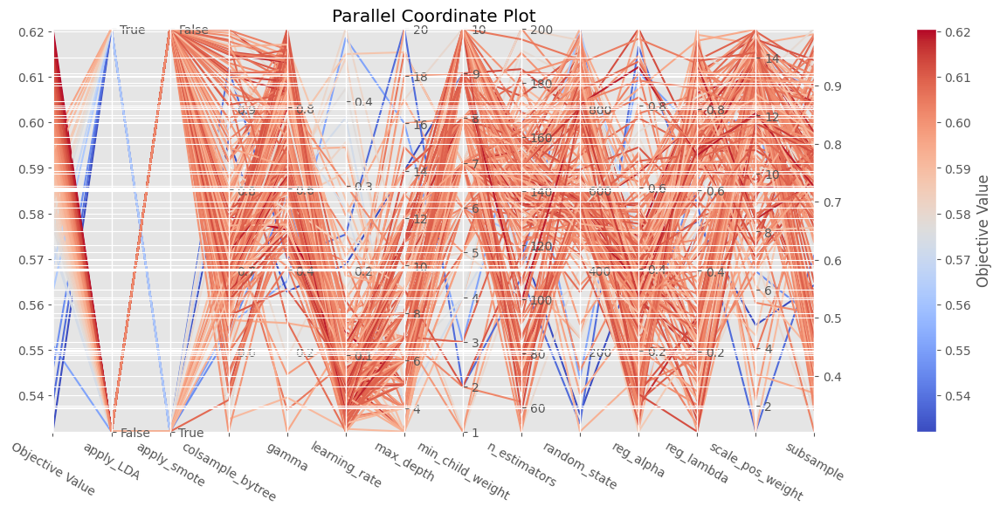

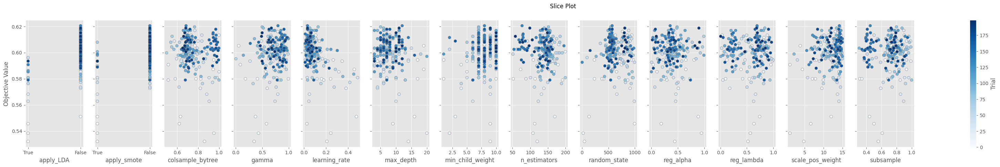

In [54]:
xgb_model = XGBClassifier(device='cuda')
res = run_optuna('XGBoost',xgb_model,n_trials=200,rs=7)
visualize_tuning(res['study'])

Trial: 199
Params: {'learning_rate': 0.09671743029558796, 'n_estimators': 170, 'max_depth': 7, 'min_child_weight': 5, 'gamma': 0.5139156071272419, 'subsample': 0.8430738546832814, 'colsample_bytree': 0.8077259836364189, 'reg_alpha': 0.3620194608819057, 'reg_lambda': 0.1945878804737572, 'scale_pos_weight': 11.917743709440852, 'random_state': 420}
Accuracy = 61.43%

Best so far :
 Trial: 171
Params: {'learning_rate': 0.06892499702436872, 'n_estimators': 142, 'max_depth': 7, 'min_child_weight': 8, 'gamma': 0.960254791247202, 'subsample': 0.8195513193788014, 'colsample_bytree': 0.5412590288322533, 'reg_alpha': 0.8660902628399882, 'reg_lambda': 0.9657001161920058, 'scale_pos_weight': 13.097732722028933, 'random_state': 421}
Accuracy = 62.69%


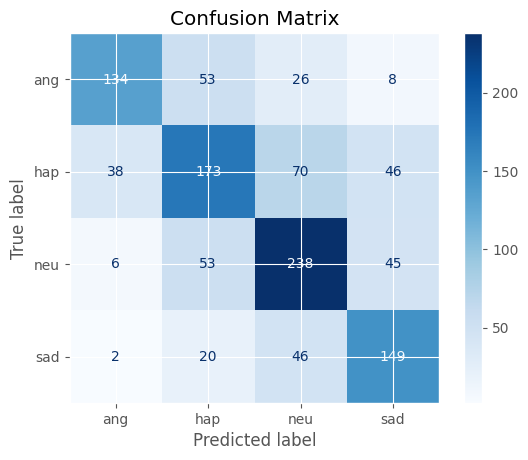


XGBoost Accuracy: 62.692%
              precision    recall  f1-score   support

           0       0.74      0.61      0.67       221
           1       0.58      0.53      0.55       327
           2       0.63      0.70      0.66       342
           3       0.60      0.69      0.64       217

    accuracy                           0.63      1107
   macro avg       0.64      0.63      0.63      1107
weighted avg       0.63      0.63      0.63      1107


Time taken = 5 min 14 sec



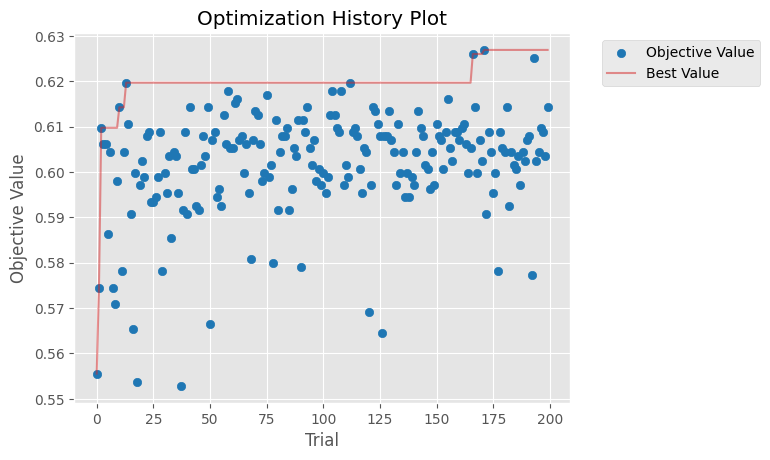

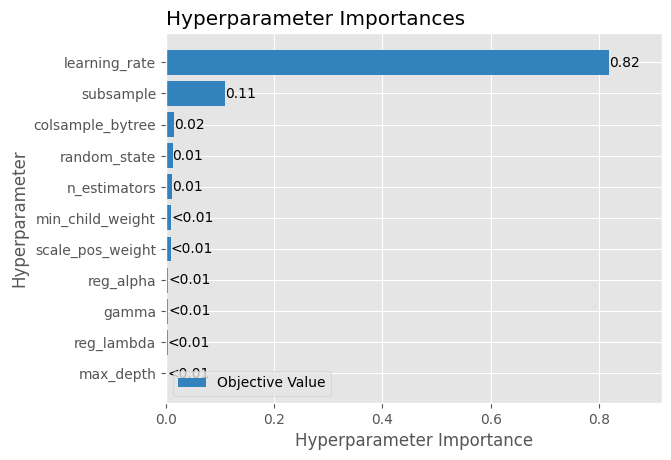

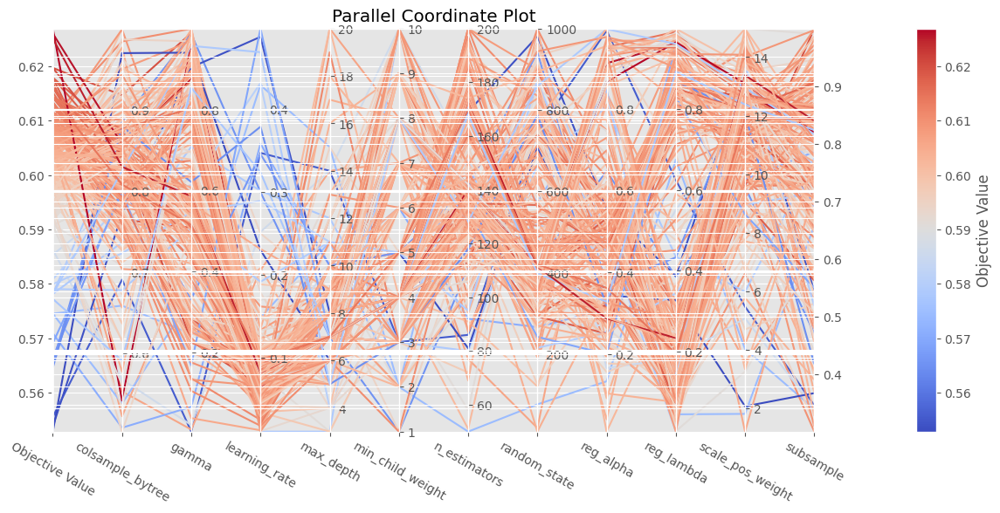

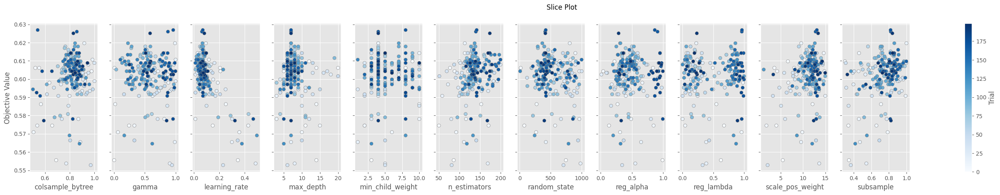

In [55]:
xgb_model = XGBClassifier(device='cuda')
res = run_optuna('XGBoost',xgb_model,n_trials=200,rs=7,apply_LDA=False,apply_smote=False)
visualize_tuning(res['study'])

Trial: 199
Params: {'learning_rate': 0.031954854131291045, 'n_estimators': 92, 'max_depth': 10, 'min_child_weight': 3, 'gamma': 0.9138094292555136, 'subsample': 0.9108327577185634, 'colsample_bytree': 0.7728407896011392, 'reg_alpha': 0.36411261516141896, 'reg_lambda': 0.9368641827013399, 'scale_pos_weight': 11.008888963383479, 'random_state': 621}
Accuracy = 60.70%

Best so far :
 Trial: 171
Params: {'learning_rate': 0.03834790016183989, 'n_estimators': 142, 'max_depth': 8, 'min_child_weight': 7, 'gamma': 0.47580260221231546, 'subsample': 0.44571557427217573, 'colsample_bytree': 0.6606418885326784, 'reg_alpha': 0.5485913388996476, 'reg_lambda': 0.7858508985338644, 'scale_pos_weight': 10.28858503390498, 'random_state': 870}
Accuracy = 62.96%


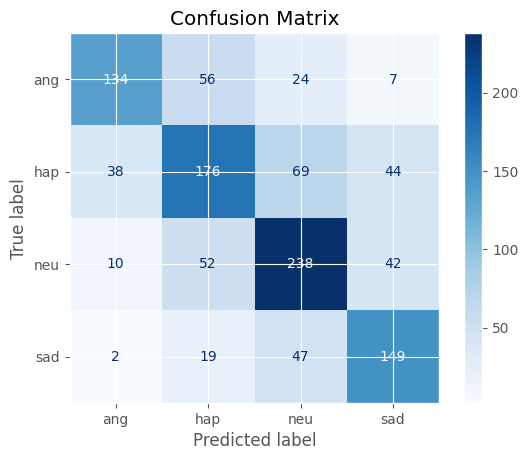


XGBoost Accuracy: 62.963%
              precision    recall  f1-score   support

           0       0.73      0.61      0.66       221
           1       0.58      0.54      0.56       327
           2       0.63      0.70      0.66       342
           3       0.62      0.69      0.65       217

    accuracy                           0.63      1107
   macro avg       0.64      0.63      0.63      1107
weighted avg       0.63      0.63      0.63      1107


Time taken = 6 min 27 sec



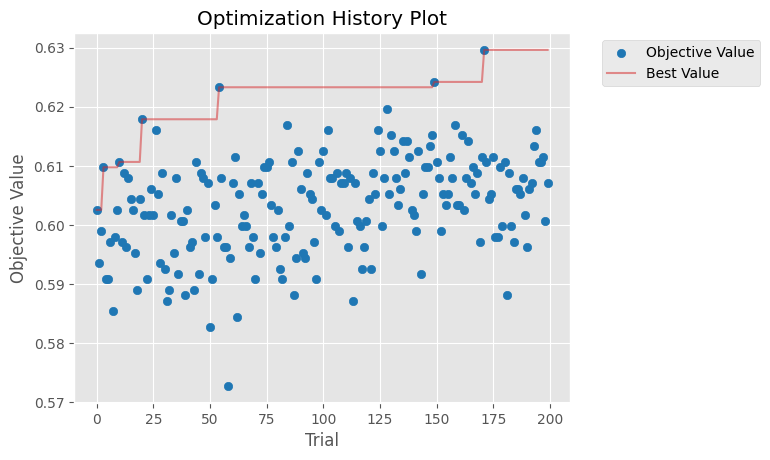

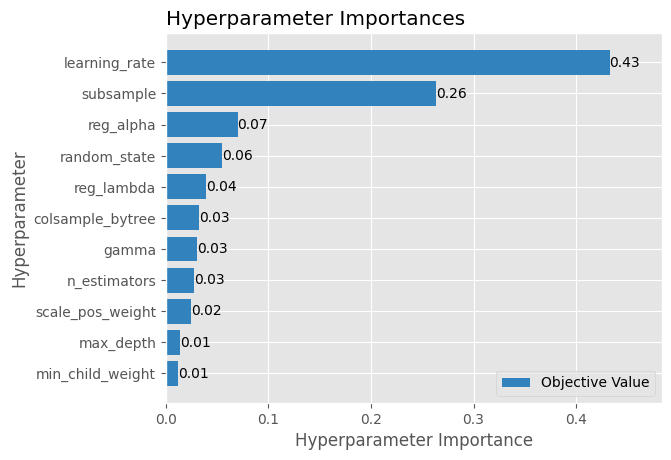

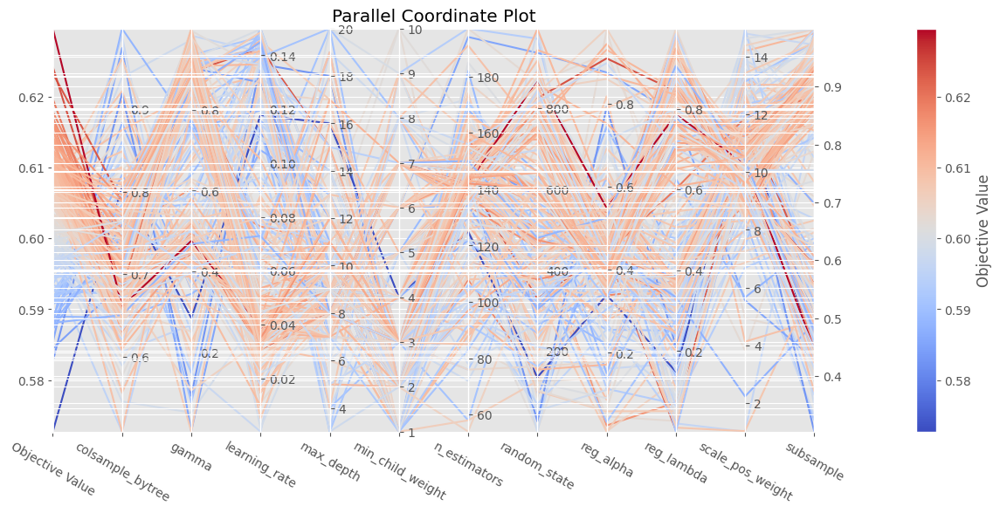

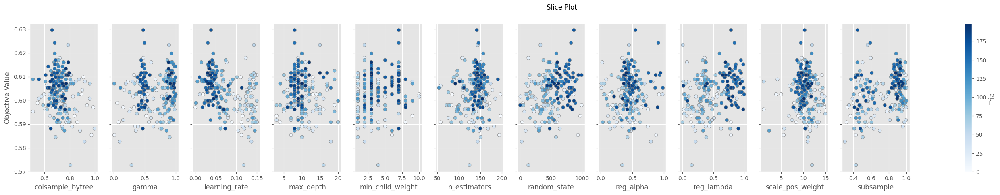

In [57]:
xgb_model = XGBClassifier(device='cuda')
sp_params = {'learning_rate':(0,0.15)}
res = run_optuna('XGBoost',xgb_model,n_trials=200,rs=7,apply_LDA=False,apply_smote=False,sp_params=sp_params)
visualize_tuning(res['study'])

### **Gaussian Naive Bayes Classifier**

Total Time taken = 0 min 10 sec

Current Accuracy = 52.03%
Best Accuracy = 59.08% at iter=55
Best Model Params Found so far = {'var_smoothing': 1e-09}

Best Preprocessing Params Found so far = {'rs': 886, 'apply_smote': False, 'apply_LDA': True}

Hyperparameter Tuning Done!


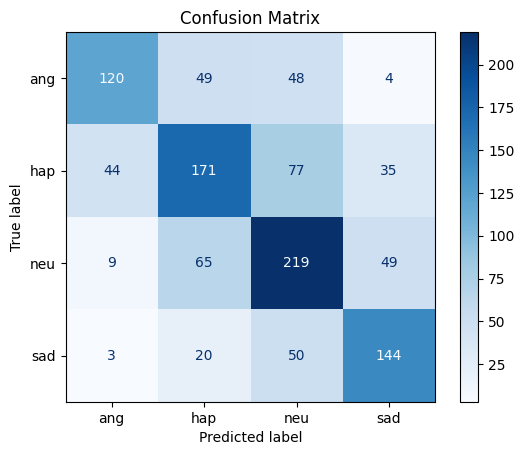


NaiveBayes Accuracy: 59.079%
              precision    recall  f1-score   support

         ang       0.68      0.54      0.60       221
         hap       0.56      0.52      0.54       327
         neu       0.56      0.64      0.60       342
         sad       0.62      0.66      0.64       217

    accuracy                           0.59      1107
   macro avg       0.60      0.59      0.60      1107
weighted avg       0.60      0.59      0.59      1107



In [21]:
nb_model = GaussianNB()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('NaiveBayes',nb_model,iters=100)

Total Time taken = 0 min 10 sec

Current Accuracy = 54.20%
Best Accuracy = 59.80% at iter=67
Best Model Params Found so far = {'var_smoothing': 1e-09}

Best Preprocessing Params Found so far = {'rs': 145, 'apply_smote': False, 'apply_LDA': True}

Hyperparameter Tuning Done!


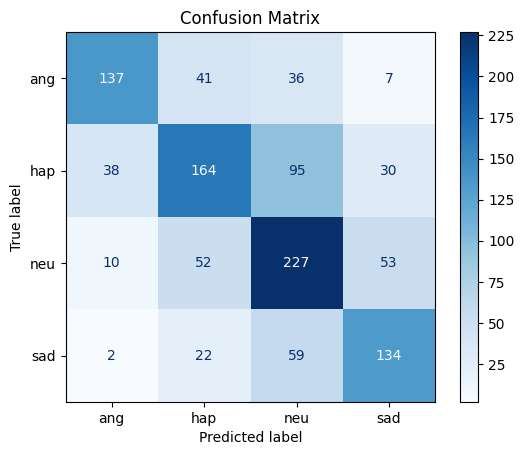


NaiveBayes Accuracy: 59.801%
              precision    recall  f1-score   support

         ang       0.73      0.62      0.67       221
         hap       0.59      0.50      0.54       327
         neu       0.54      0.66      0.60       342
         sad       0.60      0.62      0.61       217

    accuracy                           0.60      1107
   macro avg       0.62      0.60      0.60      1107
weighted avg       0.61      0.60      0.60      1107



In [22]:
nb_model = GaussianNB()
max_acc,best_model_params,best_prep_params,phist = tune_ML_hppms('NaiveBayes',nb_model,iters=100)

Trial: 99
Params: {'rs': 246, 'apply_smote': False, 'apply_LDA': False}
Accuracy = 47.88%

Best so far :
 Trial: 67
Params: {'rs': 774, 'apply_smote': False, 'apply_LDA': True}
Accuracy = 58.18%


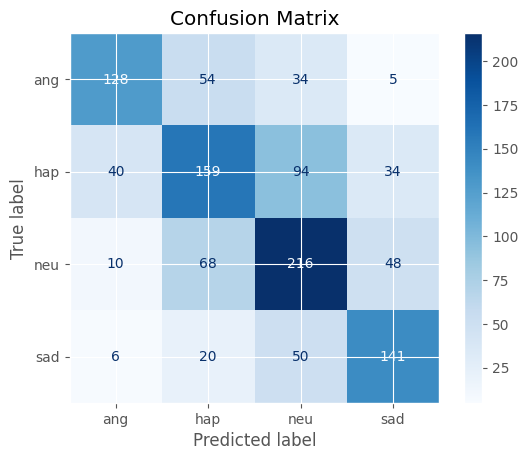


NaiveBayes Accuracy: 58.175%
              precision    recall  f1-score   support

         ang       0.70      0.58      0.63       221
         hap       0.53      0.49      0.51       327
         neu       0.55      0.63      0.59       342
         sad       0.62      0.65      0.63       217

    accuracy                           0.58      1107
   macro avg       0.60      0.59      0.59      1107
weighted avg       0.59      0.58      0.58      1107


Time taken = 0 min 13 sec



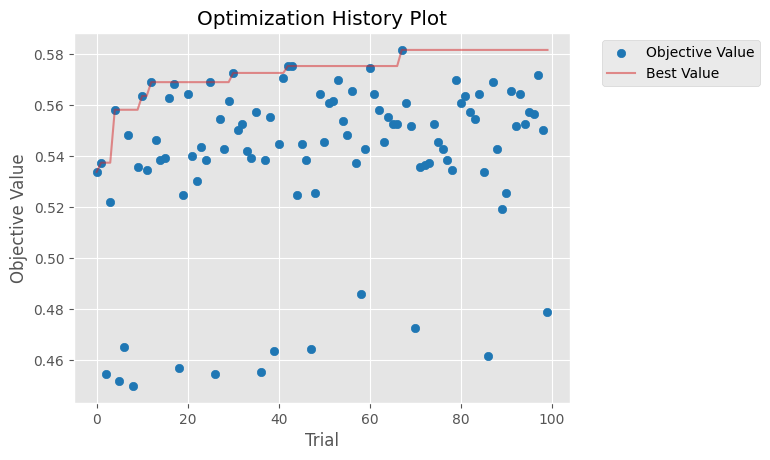

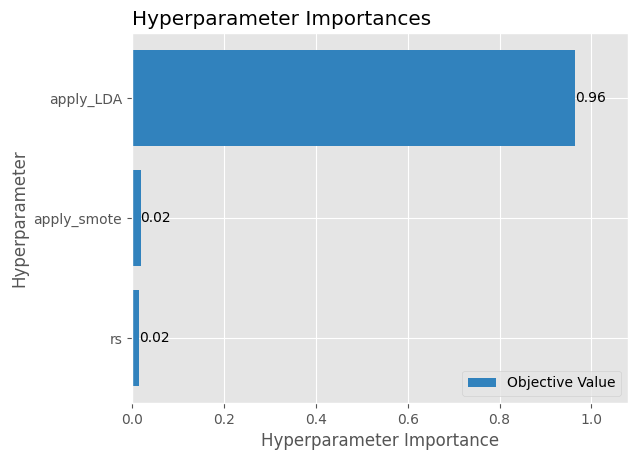

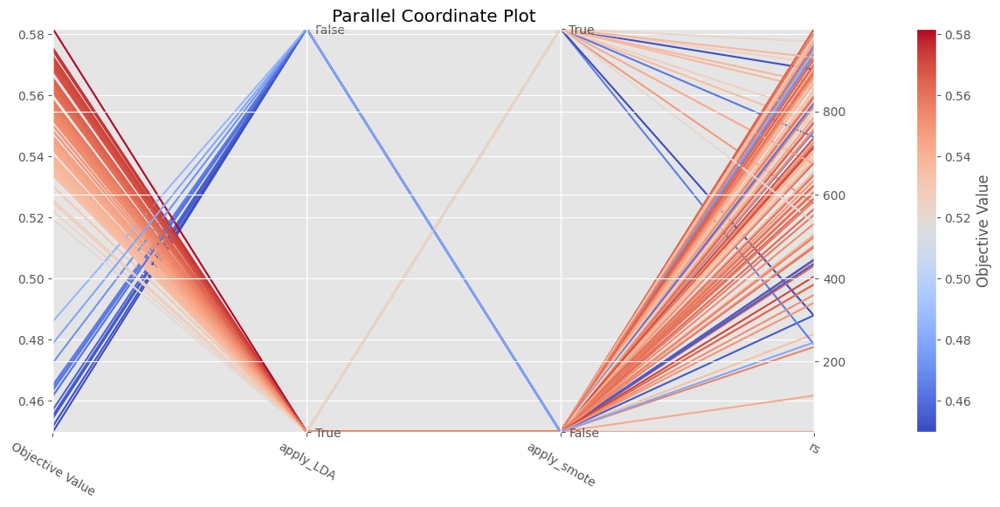

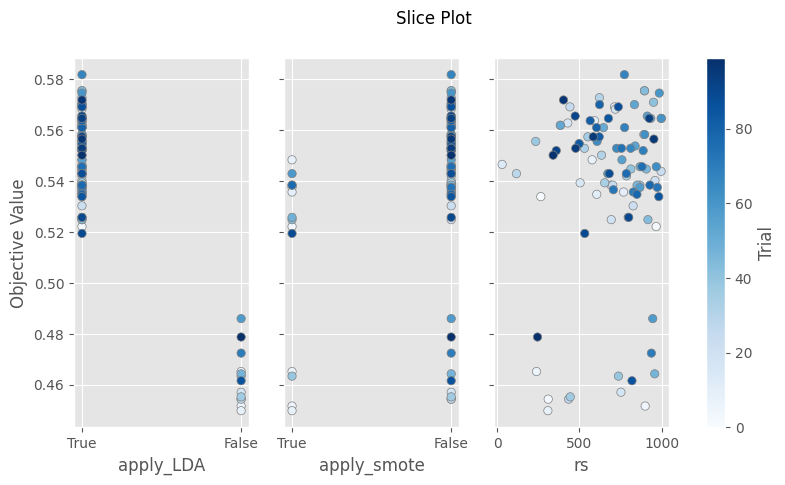

In [37]:
nb_model = GaussianNB()
res = run_optuna('NaiveBayes',nb_model,n_trials=100)
visualize_tuning(res['study'])

Trial: 99
Params: {'rs': 18}
Accuracy = 54.92%

Best so far :
 Trial: 24
Params: {'rs': 145}
Accuracy = 59.80%


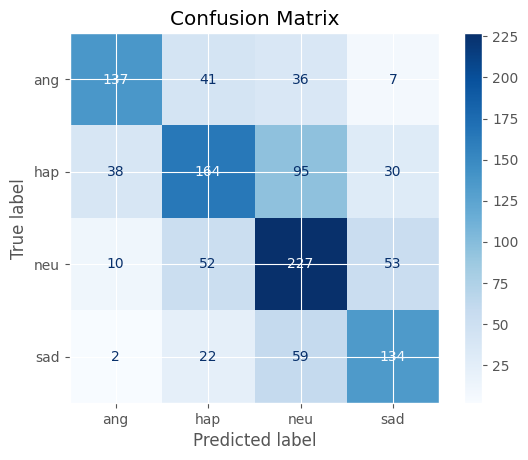


NaiveBayes Accuracy: 59.801%
              precision    recall  f1-score   support

         ang       0.73      0.62      0.67       221
         hap       0.59      0.50      0.54       327
         neu       0.54      0.66      0.60       342
         sad       0.60      0.62      0.61       217

    accuracy                           0.60      1107
   macro avg       0.62      0.60      0.60      1107
weighted avg       0.61      0.60      0.60      1107


Time taken = 0 min 11 sec



In [47]:
nb_model = GaussianNB()
res = run_optuna('NaiveBayes',nb_model,n_trials=100,apply_LDA=True,apply_smote=False)

### **Adaptive Boosting Classifier (AdaBoost)**

Trial: 499
Params: {'n_estimators': 73, 'learning_rate': 0.02881029919319483, 'random_state': 398}
Accuracy = 59.71%

Best so far :
 Trial: 68
Params: {'n_estimators': 73, 'learning_rate': 0.26933736233559386, 'random_state': 23}
Accuracy = 60.16%


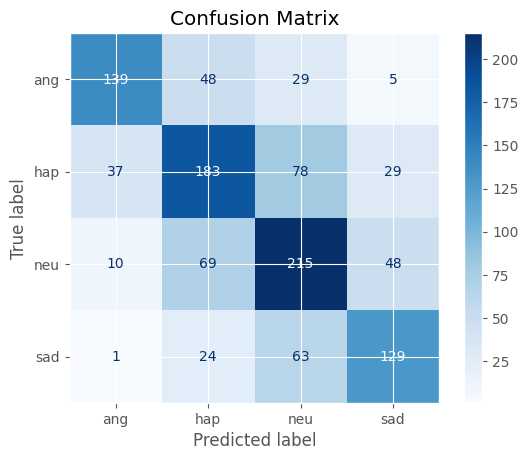


AdaBoost Accuracy: 60.163%
              precision    recall  f1-score   support

         ang       0.74      0.63      0.68       221
         hap       0.56      0.56      0.56       327
         neu       0.56      0.63      0.59       342
         sad       0.61      0.59      0.60       217

    accuracy                           0.60      1107
   macro avg       0.62      0.60      0.61      1107
weighted avg       0.61      0.60      0.60      1107


Time taken = 6 min 22 sec



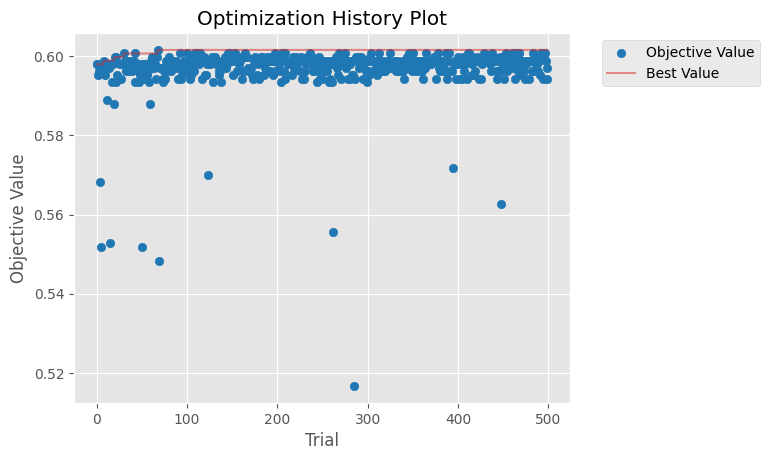

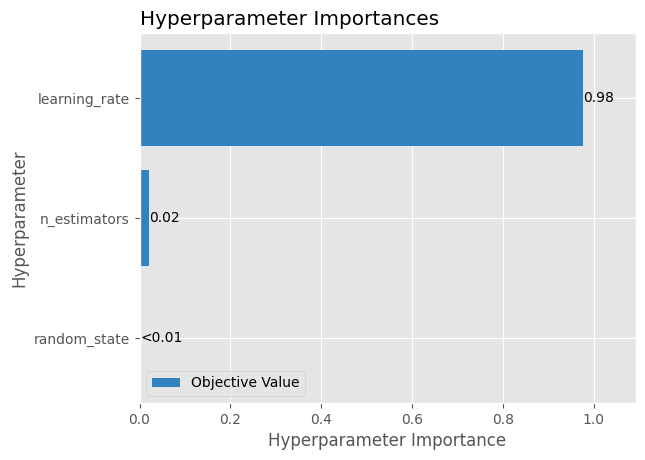

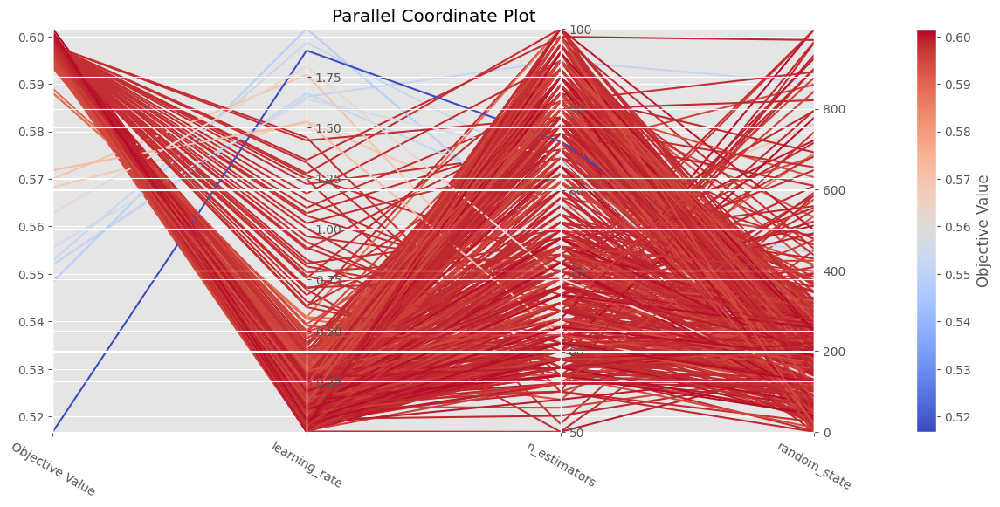

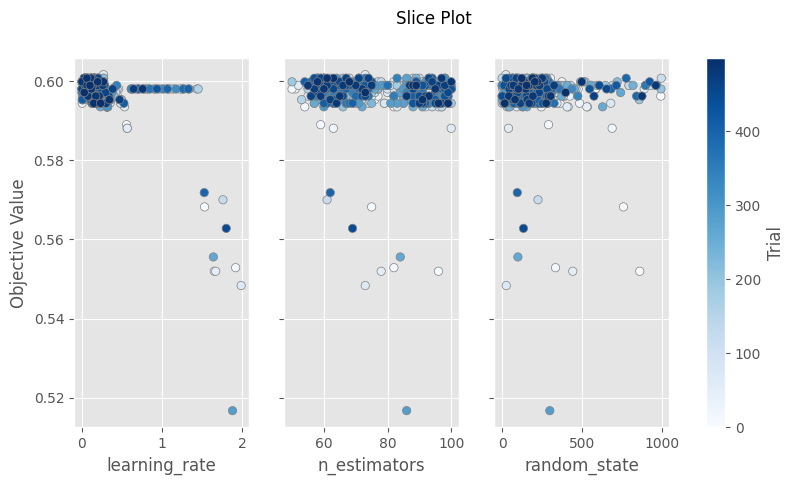

In [17]:
bnb_model = GaussianNB()
ab_model = AdaBoostClassifier(estimator=bnb_model)
res = run_optuna('AdaBoost',ab_model,n_trials=500,rs=145,apply_LDA=True,apply_smote=False)
visualize_tuning(res['study'])

Trial: 499
Params: {'n_estimators': 164, 'learning_rate': 0.08901262441734806, 'random_state': 637}
Accuracy = 59.89%

Best so far :
 Trial: 299
Params: {'n_estimators': 156, 'learning_rate': 0.26878505478347936, 'random_state': 311}
Accuracy = 60.16%


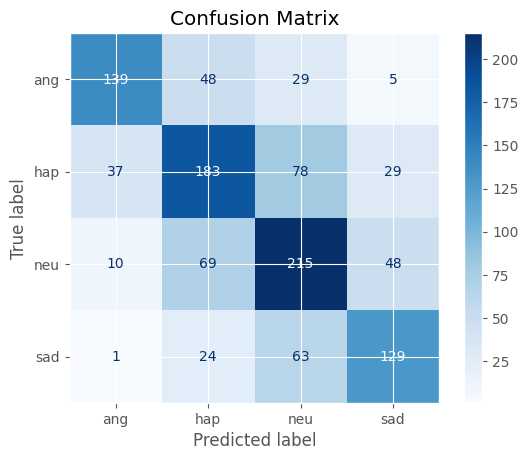


AdaBoost Accuracy: 60.163%
              precision    recall  f1-score   support

         ang       0.74      0.63      0.68       221
         hap       0.56      0.56      0.56       327
         neu       0.56      0.63      0.59       342
         sad       0.61      0.59      0.60       217

    accuracy                           0.60      1107
   macro avg       0.62      0.60      0.61      1107
weighted avg       0.61      0.60      0.60      1107


Time taken = 11 min 5 sec



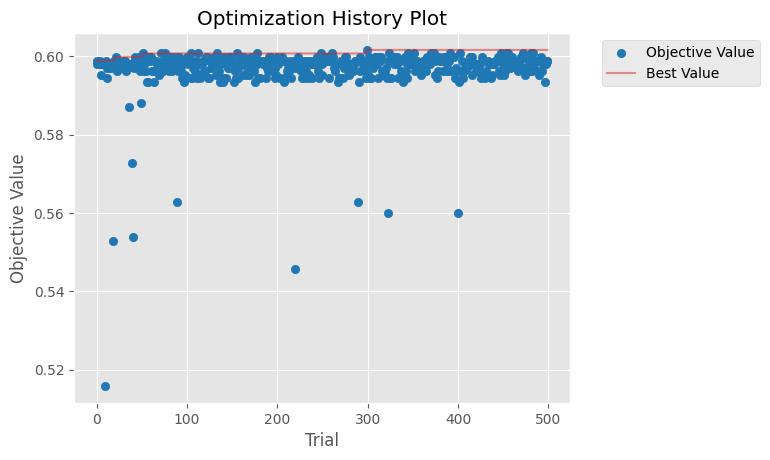

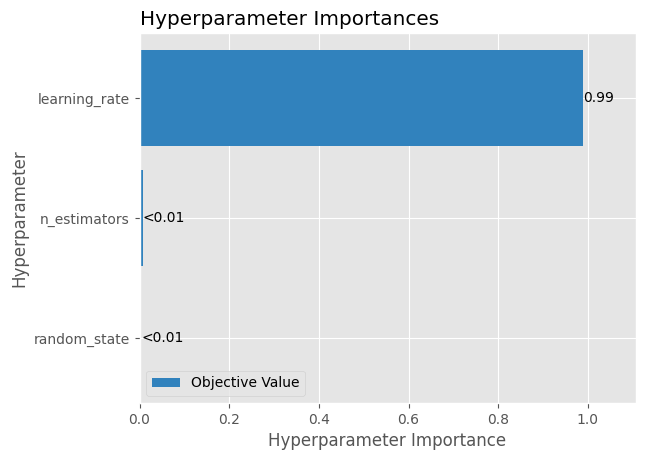

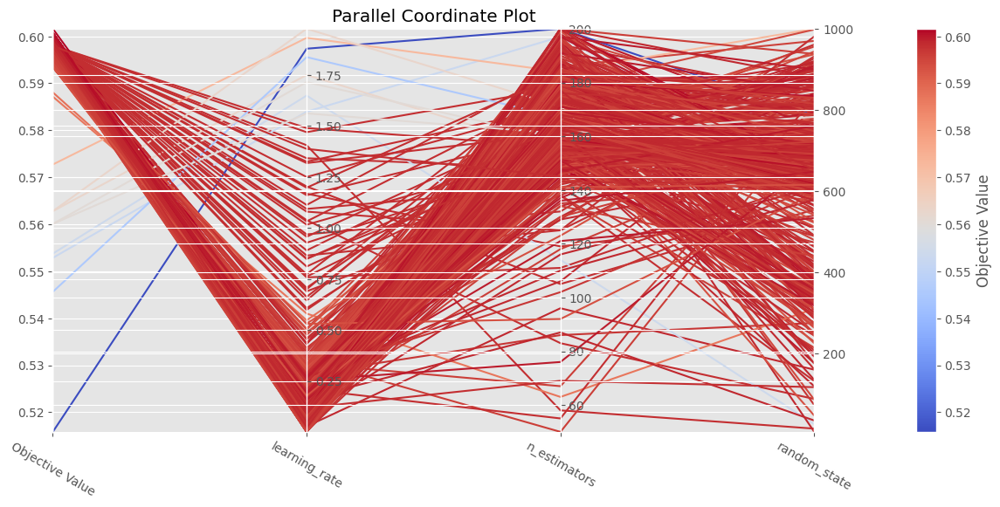

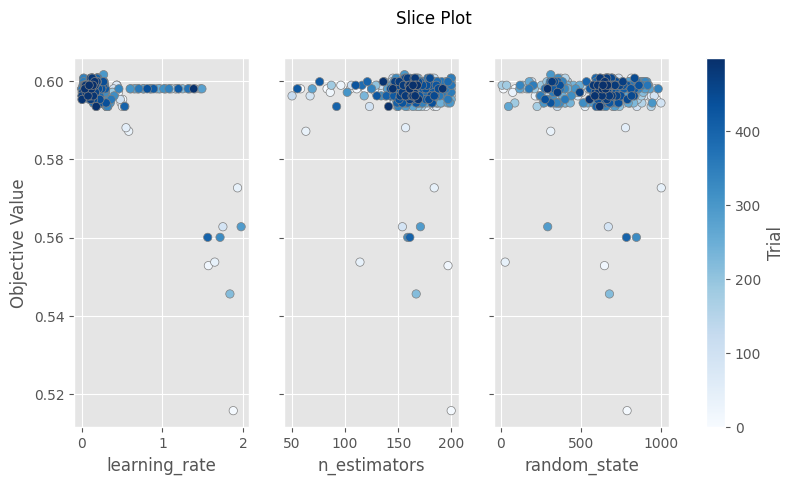

In [19]:
bnb_model = GaussianNB()
ab_model = AdaBoostClassifier(estimator=bnb_model)
sp_params = {'n_estimators':(50,200)}
res = run_optuna('AdaBoost',ab_model,n_trials=500,rs=145,apply_LDA=True,apply_smote=False,sp_params=sp_params)
visualize_tuning(res['study'])